<a href="https://colab.research.google.com/github/Akhil66624/Video-Segmentation-SAM2/blob/main/notebooks/video_predictor_example.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Copyright (c) Meta Platforms, Inc. and affiliates.

# Video segmentation with SAM 2

This notebook shows how to use SAM 2 for interactive segmentation in videos. It will cover the following:

- adding clicks (or box) on a frame to get and refine _masklets_ (spatio-temporal masks)
- propagating clicks (or box) to get _masklets_ throughout the video
- segmenting and tracking multiple objects at the same time

We use the terms _segment_ or _mask_ to refer to the model prediction for an object on a single frame, and _masklet_ to refer to the spatio-temporal masks across the entire video.

<a target="_blank" href="https://colab.research.google.com/github/facebookresearch/sam2/blob/main/notebooks/video_predictor_example.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>

## Environment Set-up

If running locally using jupyter, first install `sam2` in your environment using the [installation instructions](https://github.com/facebookresearch/sam2#installation) in the repository.

If running from Google Colab, set `using_colab=True` below and run the cell. In Colab, be sure to select 'GPU' under 'Edit'->'Notebook Settings'->'Hardware accelerator'. Note that it's recommended to use **A100 or L4 GPUs when running in Colab** (T4 GPUs might also work, but could be slow and might run out of memory in some cases).

In [1]:
using_colab = True

In [2]:
if using_colab:
    import torch
    import torchvision
    print("PyTorch version:", torch.__version__)
    print("Torchvision version:", torchvision.__version__)
    print("CUDA is available:", torch.cuda.is_available())
    import sys
    !{sys.executable} -m pip install opencv-python matplotlib
    !{sys.executable} -m pip install 'git+https://github.com/facebookresearch/sam2.git'

    !mkdir -p videos
    !wget -P videos https://dl.fbaipublicfiles.com/segment_anything_2/assets/bedroom.zip
    !unzip -d videos videos/bedroom.zip

    !mkdir -p ../checkpoints/
    !wget -P ../checkpoints/ https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_large.pt

PyTorch version: 2.6.0+cu124
Torchvision version: 0.21.0+cu124
CUDA is available: True
  Cloning https://github.com/facebookresearch/sam2.git to /tmp/pip-req-build-uy2xbks4
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/sam2.git /tmp/pip-req-build-uy2xbks4
  Resolved https://github.com/facebookresearch/sam2.git to commit 2b90b9f5ceec907a1c18123530e92e794ad901a4
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 2.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 6.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Using cached nvidia_cuda_nvrtc_cu12-12.4.127-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.4.127-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cache

## Set-up

In [3]:
import os
# if using Apple MPS, fall back to CPU for unsupported ops
os.environ["PYTORCH_ENABLE_MPS_FALLBACK"] = "1"
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image

In [4]:
# select the device for computation
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"using device: {device}")

if device.type == "cuda":
    # use bfloat16 for the entire notebook
    torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
    # turn on tfloat32 for Ampere GPUs (https://pytorch.org/docs/stable/notes/cuda.html#tensorfloat-32-tf32-on-ampere-devices)
    if torch.cuda.get_device_properties(0).major >= 8:
        torch.backends.cuda.matmul.allow_tf32 = True
        torch.backends.cudnn.allow_tf32 = True
elif device.type == "mps":
    print(
        "\nSupport for MPS devices is preliminary. SAM 2 is trained with CUDA and might "
        "give numerically different outputs and sometimes degraded performance on MPS. "
        "See e.g. https://github.com/pytorch/pytorch/issues/84936 for a discussion."
    )

using device: cuda


### Loading the SAM 2 video predictor

In [5]:
from sam2.build_sam import build_sam2_video_predictor

sam2_checkpoint = "../checkpoints/sam2.1_hiera_large.pt"
model_cfg = "configs/sam2.1/sam2.1_hiera_l.yaml"

predictor = build_sam2_video_predictor(model_cfg, sam2_checkpoint, device=device)

In [6]:
def show_mask(mask, ax, obj_id=None, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        cmap = plt.get_cmap("tab10")
        cmap_idx = 0 if obj_id is None else obj_id
        color = np.array([*cmap(cmap_idx)[:3], 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)


def show_points(coords, labels, ax, marker_size=200):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)


def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0, 0, 0, 0), lw=2))

#### Select an example video

We assume that the video is stored as a list of JPEG frames with filenames like `<frame_index>.jpg`.

For your custom videos, you can extract their JPEG frames using ffmpeg (https://ffmpeg.org/) as follows:
```
ffmpeg -i <your_video>.mp4 -q:v 2 -start_number 0 <output_dir>/'%05d.jpg'
```
where `-q:v` generates high-quality JPEG frames and `-start_number 0` asks ffmpeg to start the JPEG file from `00000.jpg`.

### **Code segment to delete image files in the specified directory**

In [25]:
import os
folder_path = "./segmented_frames_Exercise1"  # Replace with the actual path
files = os.listdir(folder_path)
for file in files:
    if file.endswith((".jpg", ".jpeg", ".png", ".gif", ".bmp")):  # Add other image extensions as needed
        file_path = os.path.join(folder_path, file)
        os.remove(file_path)

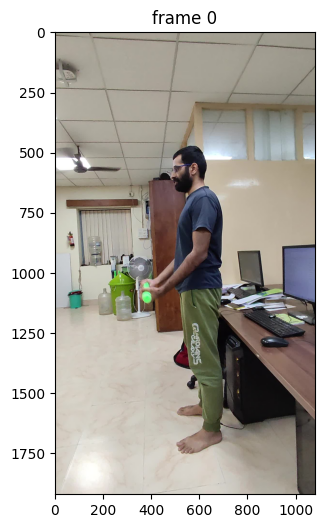

In [10]:
# `video_dir` a directory of JPEG frames with filenames like `<frame_index>.jpg`
video_dir = "./videos/Exercice1"

# scan all the JPEG frame names in this directory
frame_names = [
    p for p in os.listdir(video_dir)
    if os.path.splitext(p)[-1] in [".jpg", ".jpeg", ".JPG", ".JPEG"]
]
frame_names.sort(key=lambda p: int(os.path.splitext(p)[0]))

# take a look the first video frame
frame_idx = 0
plt.figure(figsize=(9, 6))
plt.title(f"frame {frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[frame_idx])))

#### Initialize the inference state

SAM 2 requires stateful inference for interactive video segmentation, so we need to initialize an **inference state** on this video.

During initialization, it loads all the JPEG frames in `video_path` and stores their pixels in `inference_state` (as shown in the progress bar below).

In [11]:
inference_state = predictor.init_state(video_path=video_dir)

frame loading (JPEG): 100%|██████████| 438/438 [00:27<00:00, 15.88it/s]


### Example 1: Segment & track one object

Note: if you have run any previous tracking using this `inference_state`, please reset it first via `reset_state`.

(The cell below is just for illustration; it's not needed to call `reset_state` here as this `inference_state` is just freshly initialized above.)

In [ ]:
predictor.reset_state(inference_state)

#### Step 1: Add a first click on a frame

To get started, let's try to segment the child on the left.

Here we make a **positive click** at (x, y) = (210, 350) with label `1`, by sending their coordinates and labels into the `add_new_points_or_box` API.

Note: label `1` indicates a *positive click (to add a region)* while label `0` indicates a *negative click (to remove a region)*.

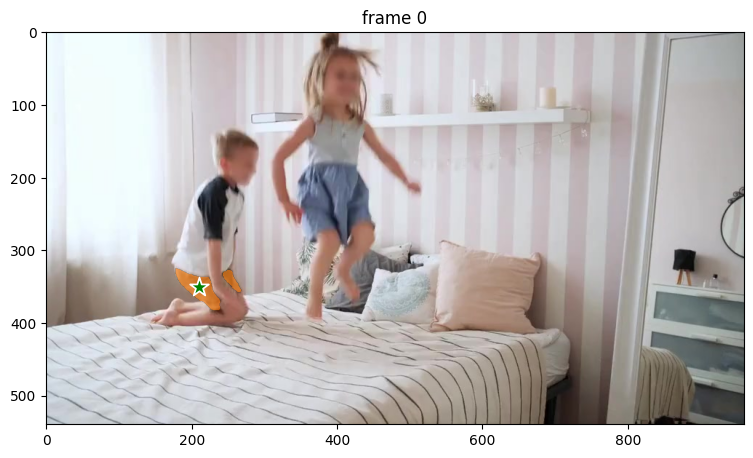

In [ ]:
ann_frame_idx = 0  # the frame index we interact with
ann_obj_id = 1  # give a unique id to each object we interact with (it can be any integers)

# Let's add a positive click at (x, y) = (210, 350) to get started
points = np.array([[210, 350]], dtype=np.float32)
# for labels, `1` means positive click and `0` means negative click
labels = np.array([1], np.int32)
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

# show the results on the current (interacted) frame
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_points(points, labels, plt.gca())
show_mask((out_mask_logits[0] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_ids[0])

#### Step 2: Add a second click to refine the prediction

Hmm, it seems that although we wanted to segment the child on the left, the model predicts the mask for only the shorts -- this can happen since there is ambiguity from a single click about what the target object should be. We can refine the mask on this frame via another positive click on the child's shirt.

Here we make a **second positive click** at (x, y) = (250, 220) with label `1` to expand the mask.

Note: we need to send **all the clicks and their labels** (i.e. not just the last click) when calling `add_new_points_or_box`.

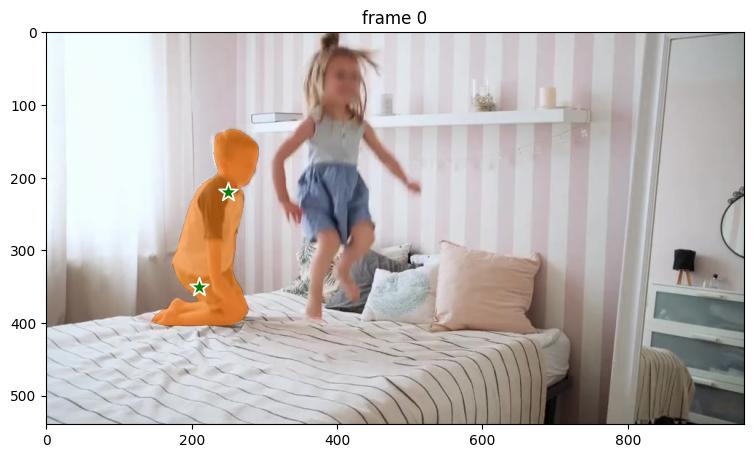

In [ ]:
ann_frame_idx = 0  # the frame index we interact with
ann_obj_id = 1  # give a unique id to each object we interact with (it can be any integers)

# Let's add a 2nd positive click at (x, y) = (250, 220) to refine the mask
# sending all clicks (and their labels) to `add_new_points_or_box`
points = np.array([[210, 350], [250, 220]], dtype=np.float32)
# for labels, `1` means positive click and `0` means negative click
labels = np.array([1, 1], np.int32)
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

# show the results on the current (interacted) frame
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_points(points, labels, plt.gca())
show_mask((out_mask_logits[0] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_ids[0])

With this 2nd refinement click, now we get a segmentation mask of the entire child on frame 0.

#### Step 3: Propagate the prompts to get the masklet across the video

To get the masklet throughout the entire video, we propagate the prompts using the `propagate_in_video` API.

propagate in video: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [00:08<00:00, 22.76it/s]


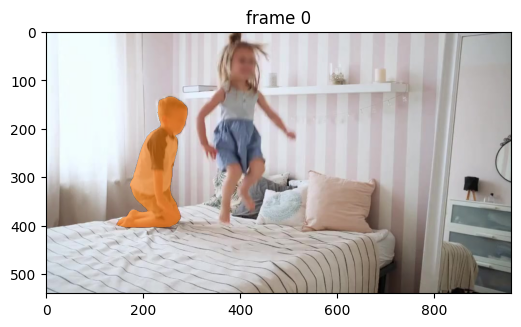

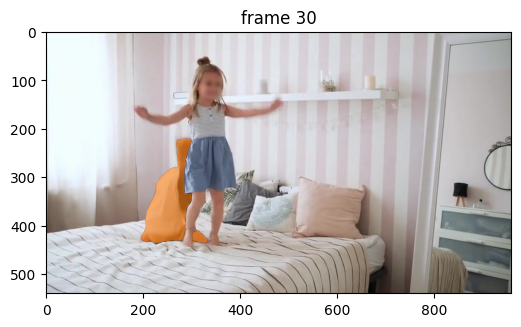

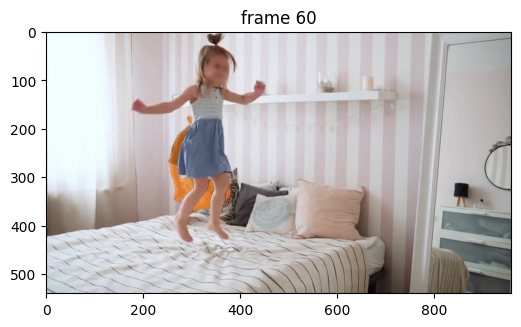

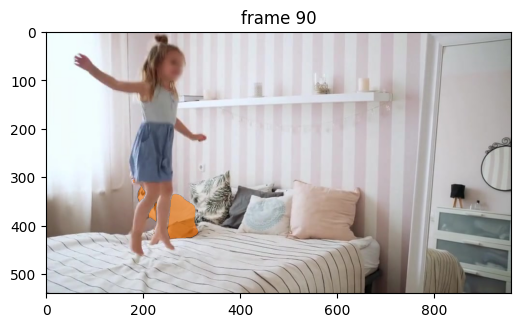

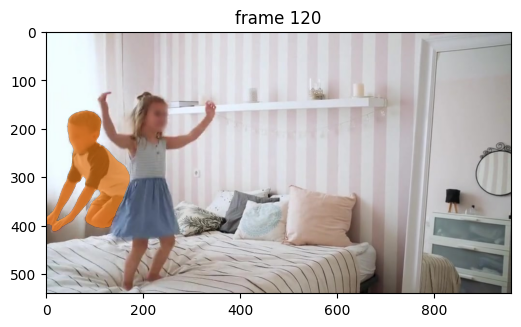

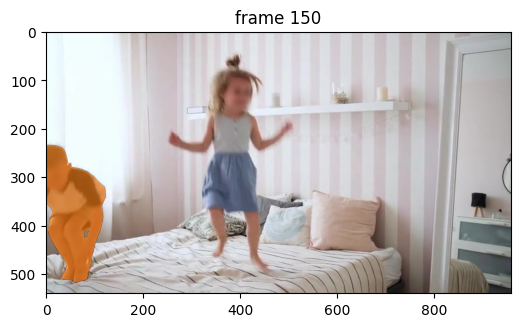

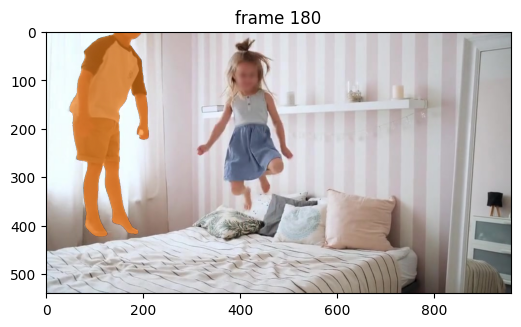

In [ ]:
# run propagation throughout the video and collect the results in a dict
video_segments = {}  # video_segments contains the per-frame segmentation results
for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
    video_segments[out_frame_idx] = {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
        for i, out_obj_id in enumerate(out_obj_ids)
    }

# render the segmentation results every few frames
vis_frame_stride = 30
plt.close("all")
for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(video_dir, frame_names[out_frame_idx])))
    for out_obj_id, out_mask in video_segments[out_frame_idx].items():
        show_mask(out_mask, plt.gca(), obj_id=out_obj_id)

#### Step 4: Add new prompts to further refine the masklet

It appears that in the output masklet above, there are some small imperfections in boundary details on frame 150.

With SAM 2 we can fix the model predictions interactively. We can add a **negative click** at (x, y) = (82, 415) on this frame with label `0` to refine the masklet. Here we call the `add_new_points_or_box` API with a different `frame_idx` argument to indicate the frame index we want to refine.

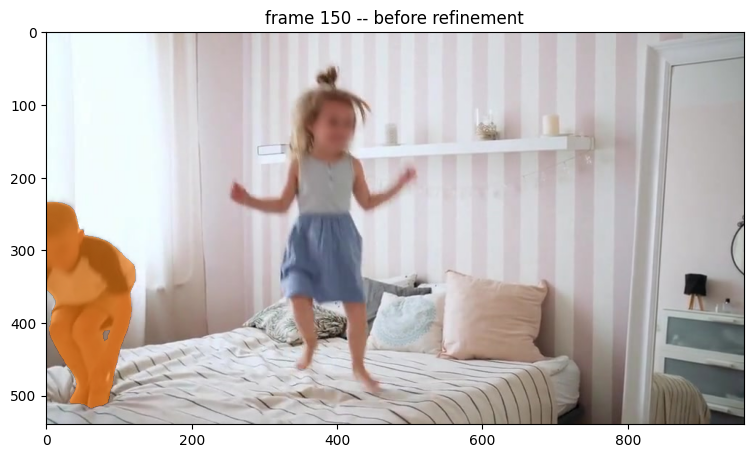

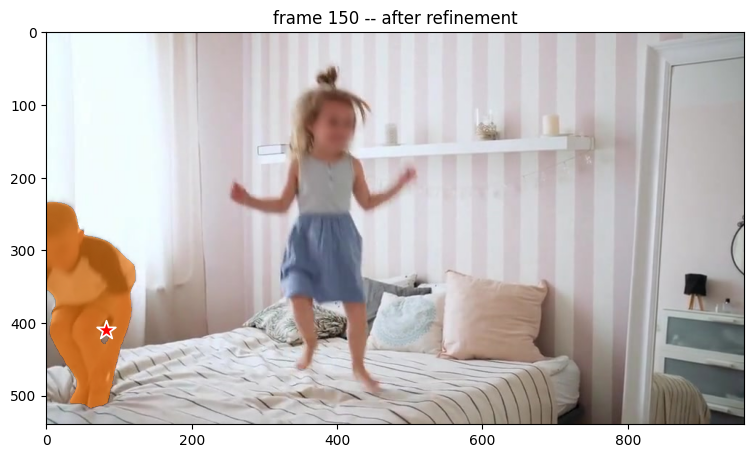

In [ ]:
ann_frame_idx = 150  # further refine some details on this frame
ann_obj_id = 1  # give a unique id to the object we interact with (it can be any integers)

# show the segment before further refinement
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx} -- before refinement")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_mask(video_segments[ann_frame_idx][ann_obj_id], plt.gca(), obj_id=ann_obj_id)

# Let's add a negative click on this frame at (x, y) = (82, 415) to refine the segment
points = np.array([[82, 410]], dtype=np.float32)
# for labels, `1` means positive click and `0` means negative click
labels = np.array([0], np.int32)
_, _, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

# show the segment after the further refinement
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx} -- after refinement")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_points(points, labels, plt.gca())
show_mask((out_mask_logits > 0.0).cpu().numpy(), plt.gca(), obj_id=ann_obj_id)

#### Step 5: Propagate the prompts (again) to get the masklet across the video

Let's get an updated masklet for the entire video. Here we call `propagate_in_video` again to propagate all the prompts after adding the new refinement click above.

propagate in video: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [00:08<00:00, 23.09it/s]


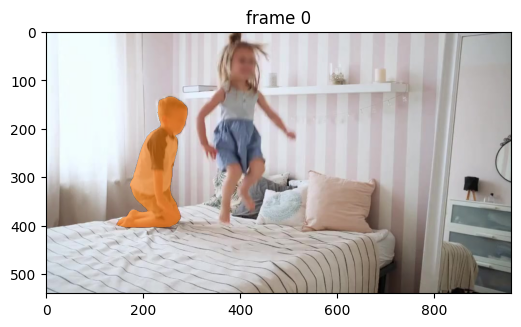

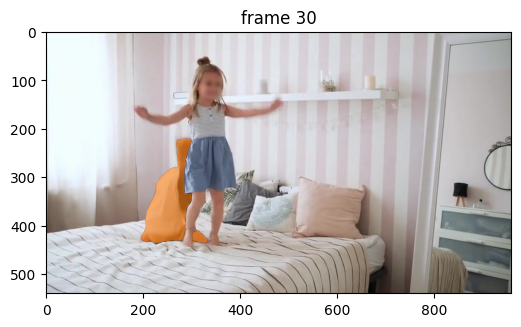

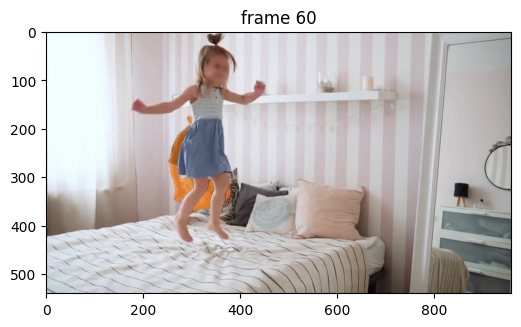

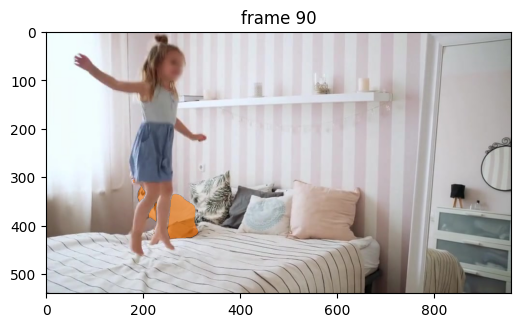

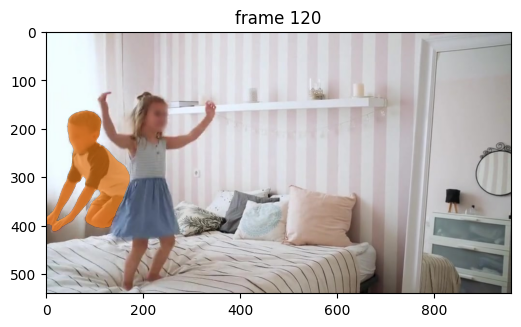

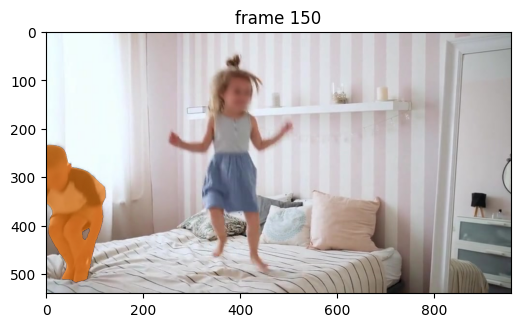

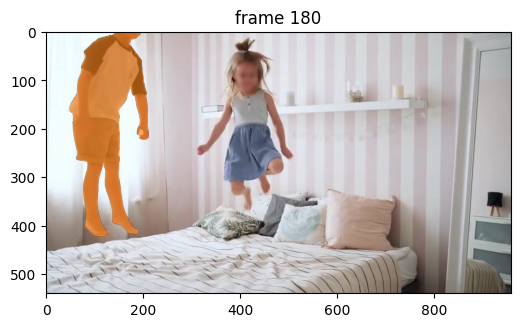

In [ ]:
# run propagation throughout the video and collect the results in a dict
video_segments = {}  # video_segments contains the per-frame segmentation results
for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
    video_segments[out_frame_idx] = {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
        for i, out_obj_id in enumerate(out_obj_ids)
    }

# render the segmentation results every few frames
vis_frame_stride = 30
plt.close("all")
for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(video_dir, frame_names[out_frame_idx])))
    for out_obj_id, out_mask in video_segments[out_frame_idx].items():
        show_mask(out_mask, plt.gca(), obj_id=out_obj_id)

The segments now look good on all frames.

### Example 2: Segment an object using box prompt

Note: if you have run any previous tracking using this `inference_state`, please reset it first via `reset_state`.

In [ ]:
predictor.reset_state(inference_state)

In addition to using clicks as inputs, SAM 2 also supports segmenting and tracking objects in a video via **bounding boxes**.

In the example below, we segment the child on the right using a **box prompt** of (x_min, y_min, x_max, y_max) = (300, 0, 500, 400) on frame 0 as input into the `add_new_points_or_box` API.

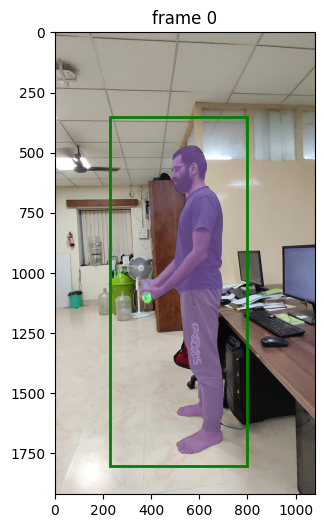

In [19]:
ann_frame_idx = 0  # the frame index we interact with
ann_obj_id = 4  # give a unique id to each object we interact with (it can be any integers)

# Let's add a box at (x_min, y_min, x_max, y_max) = (300, 0, 500, 400) to get started
box = np.array([230, 350, 800, 1800], dtype=np.float32)
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    box=box,
)

# show the results on the current (interacted) frame
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_box(box, plt.gca())
show_mask((out_mask_logits[0] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_ids[0])

Here, SAM 2 gets a pretty good segmentation mask of the entire child, even though the input bounding box is not perfectly tight around the object.

Similar to the previous example, if the returned mask from is not perfect when using a box prompt, we can also further **refine** the output using positive or negative clicks. To illustrate this, here we make a **positive click** at (x, y) = (460, 60) with label `1` to expand the segment around the child's hair.

Note: to refine the segmentation mask from a box prompt, we need to send **both the original box input and all subsequent refinement clicks and their labels** when calling `add_new_points_or_box`.

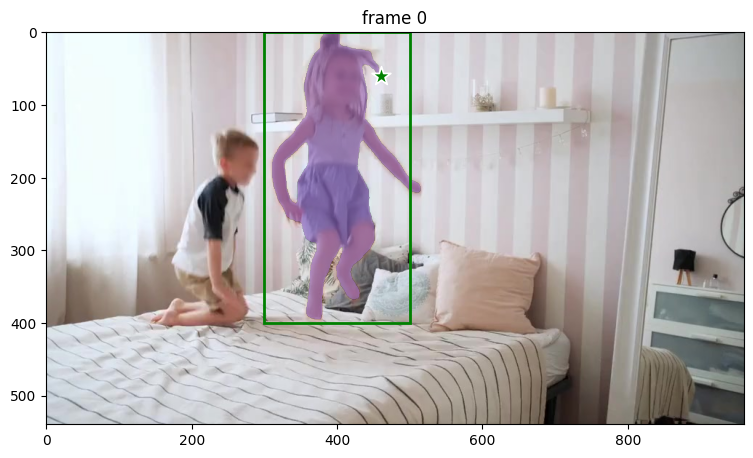

In [ ]:
ann_frame_idx = 0  # the frame index we interact with
ann_obj_id = 4  # give a unique id to each object we interact with (it can be any integers)

# Let's add a positive click at (x, y) = (460, 60) to refine the mask
points = np.array([[460, 60]], dtype=np.float32)
# for labels, `1` means positive click and `0` means negative click
labels = np.array([1], np.int32)
# note that we also need to send the original box input along with
# the new refinement click together into `add_new_points_or_box`
box = np.array([300, 0, 500, 400], dtype=np.float32)
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
    box=box,
)

# show the results on the current (interacted) frame
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_box(box, plt.gca())
show_points(points, labels, plt.gca())
show_mask((out_mask_logits[0] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_ids[0])

Then, to get the masklet throughout the entire video, we propagate the prompts using the `propagate_in_video` API.

propagate in video: 100%|██████████| 438/438 [08:22<00:00,  1.15s/it]


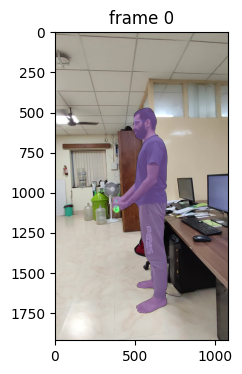

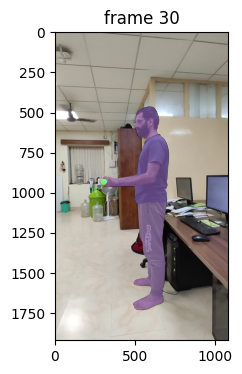

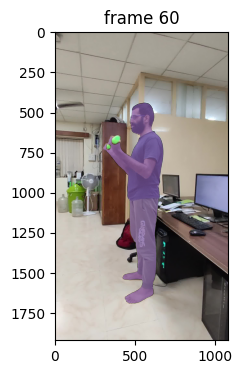

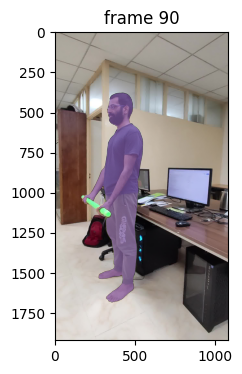

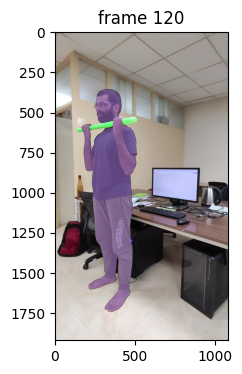

...

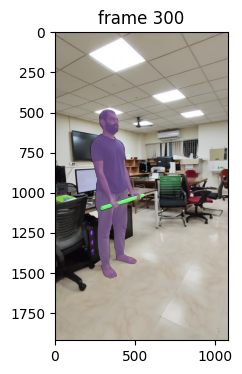

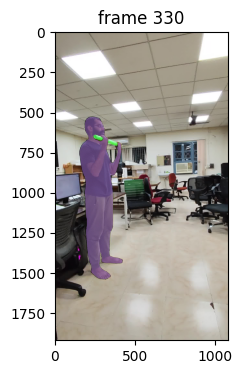

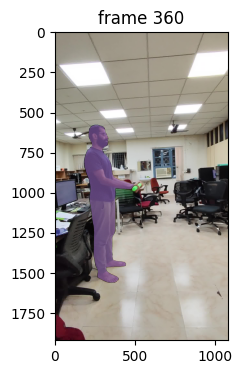

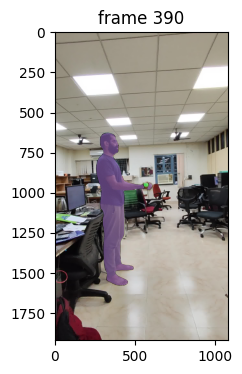

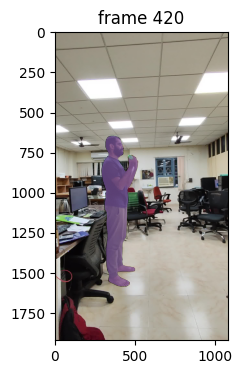

In [20]:
# run propagation throughout the video and collect the results in a dict
video_segments = {}  # video_segments contains the per-frame segmentation results
for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
    video_segments[out_frame_idx] = {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
        for i, out_obj_id in enumerate(out_obj_ids)
    }

# render the segmentation results every few frames
vis_frame_stride = 30
plt.close("all")
for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(video_dir, frame_names[out_frame_idx])))
    for out_obj_id, out_mask in video_segments[out_frame_idx].items():
        show_mask(out_mask, plt.gca(), obj_id=out_obj_id)

# This section of code stores the segmented region as an RGB image with black background

Frame 0, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


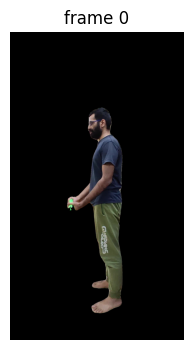

Frame 1, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


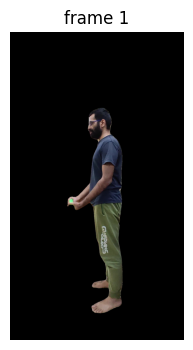

Frame 2, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


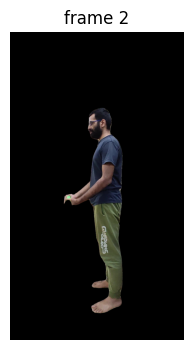

Frame 3, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


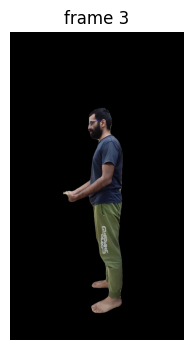

Frame 4, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


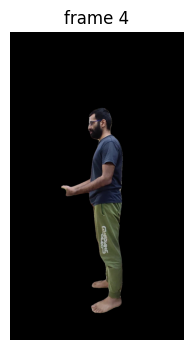

Frame 5, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


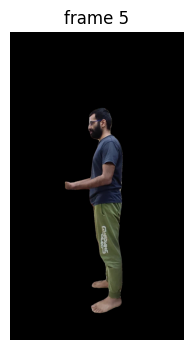

Frame 6, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


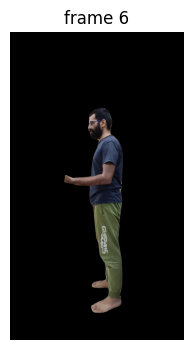

Frame 7, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


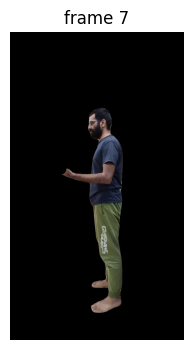

Frame 8, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


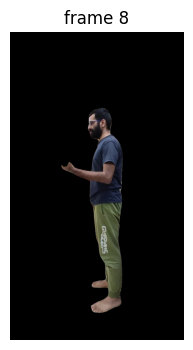

Frame 9, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


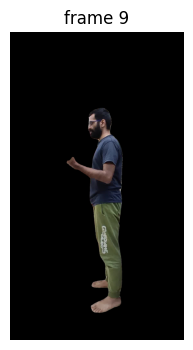

Frame 10, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


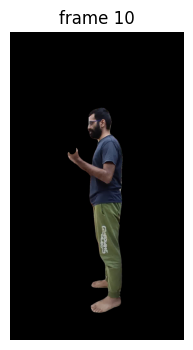

Frame 11, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


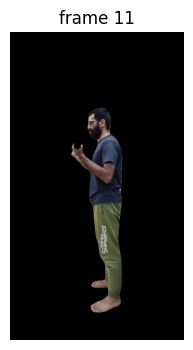

Frame 12, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


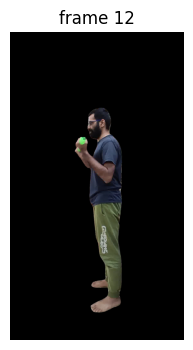

Frame 13, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


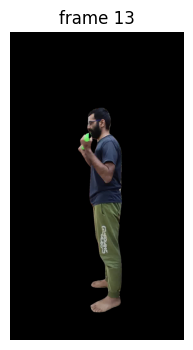

Frame 14, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


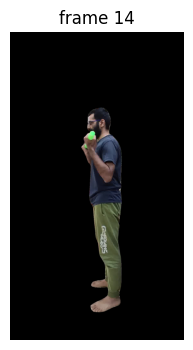

Frame 15, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


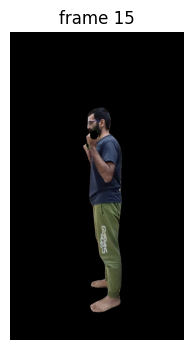

Frame 16, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


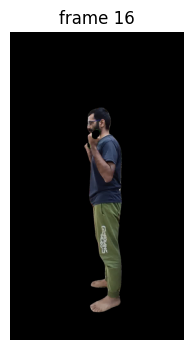

Frame 17, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


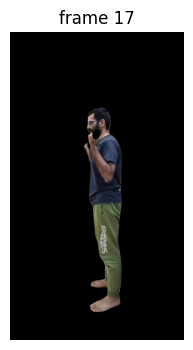

Frame 18, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


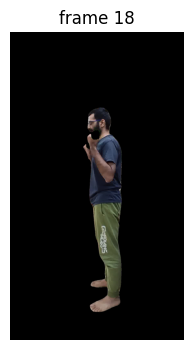

Frame 19, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


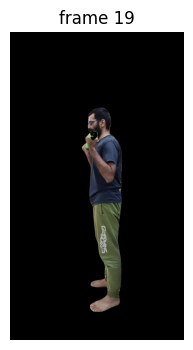

Frame 20, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


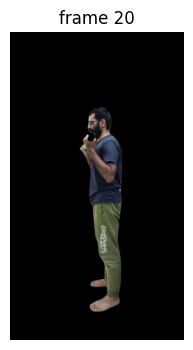

Frame 21, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


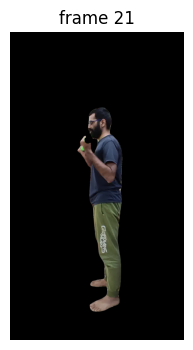

Frame 22, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


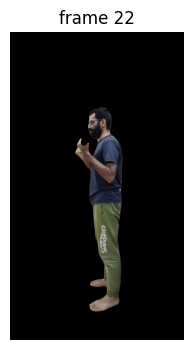

Frame 23, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


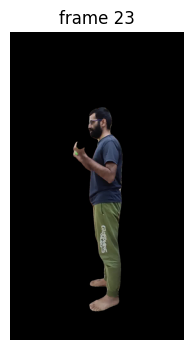

Frame 24, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


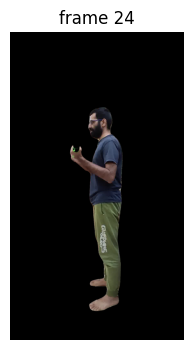

Frame 25, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


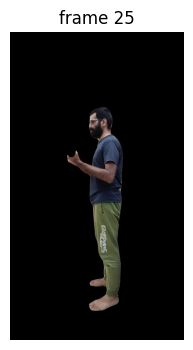

Frame 26, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


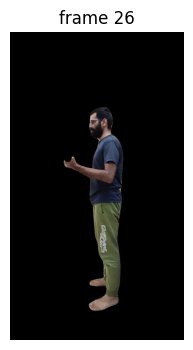

Frame 27, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


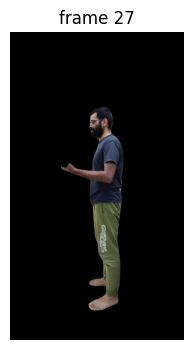

Frame 28, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


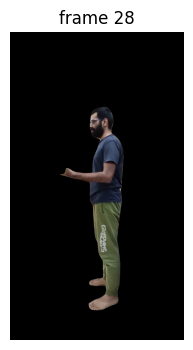

Frame 29, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


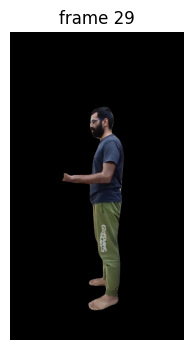

Frame 30, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


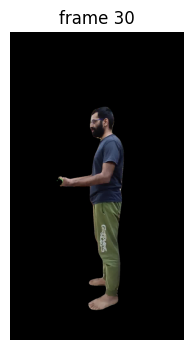

Frame 31, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


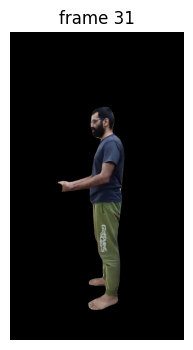

Frame 32, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


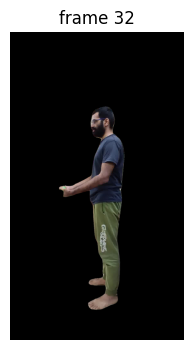

Frame 33, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


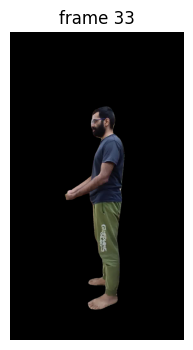

Frame 34, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


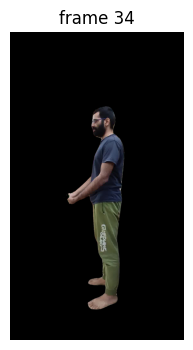

Frame 35, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


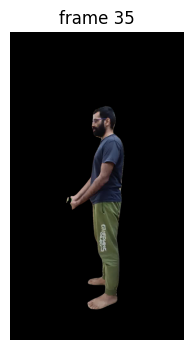

Frame 36, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


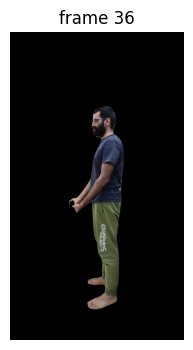

Frame 37, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


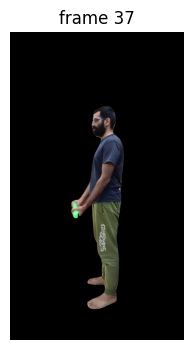

Frame 38, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


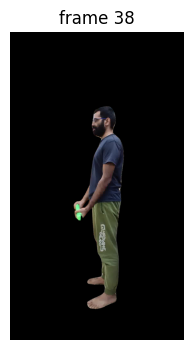

Frame 39, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


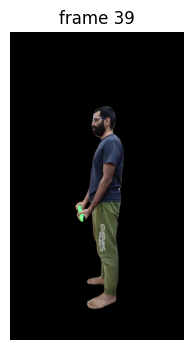

Frame 40, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


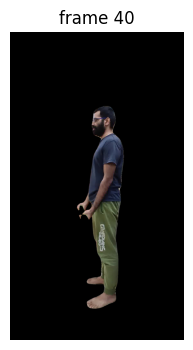

Frame 41, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


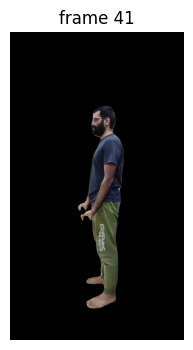

Frame 42, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


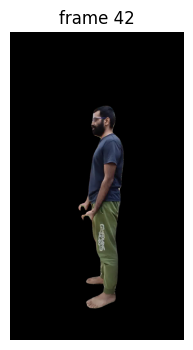

Frame 43, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


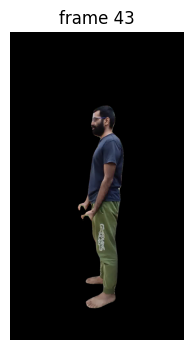

Frame 44, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


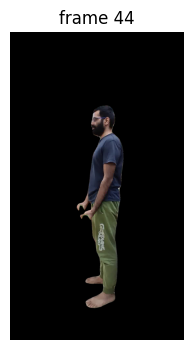

Frame 45, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


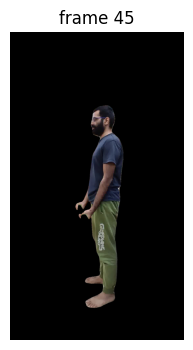

Frame 46, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


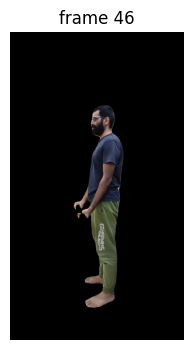

Frame 47, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


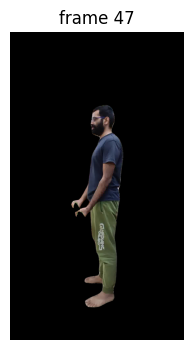

Frame 48, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


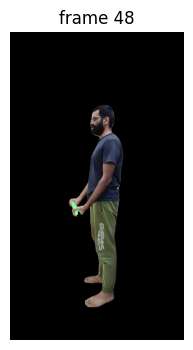

Frame 49, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


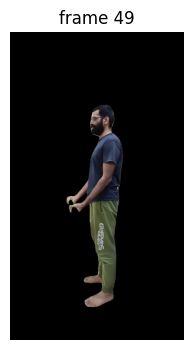

Frame 50, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


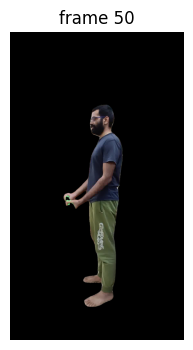

Frame 51, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


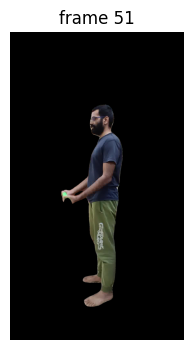

Frame 52, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


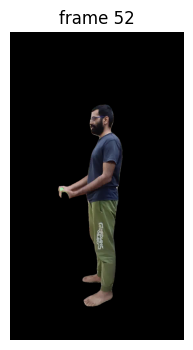

Frame 53, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


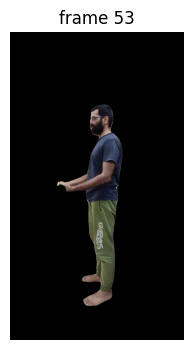

Frame 54, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


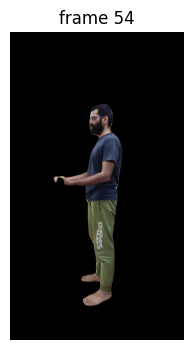

Frame 55, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


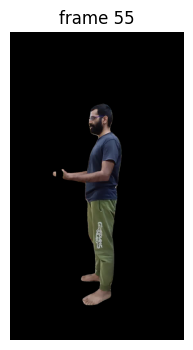

Frame 56, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


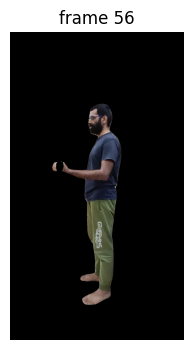

Frame 57, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


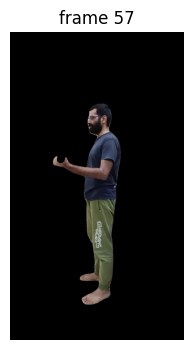

Frame 58, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


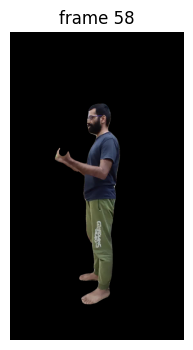

Frame 59, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


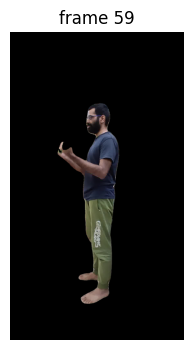

Frame 60, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


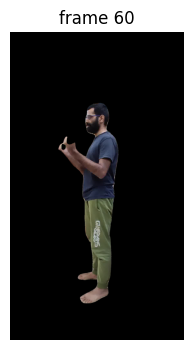

Frame 61, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


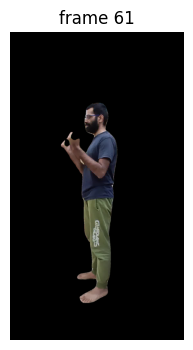

Frame 62, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


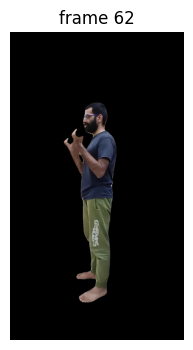

Frame 63, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


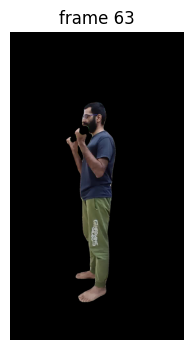

Frame 64, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


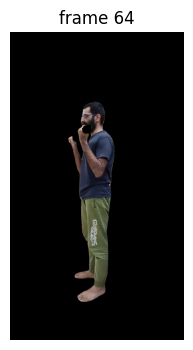

Frame 65, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


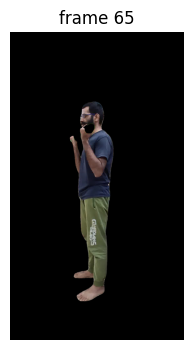

Frame 66, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


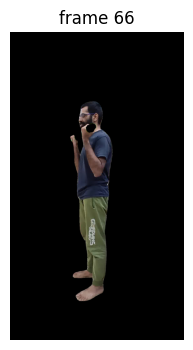

Frame 67, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


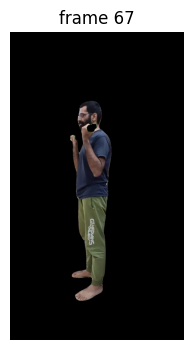

Frame 68, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


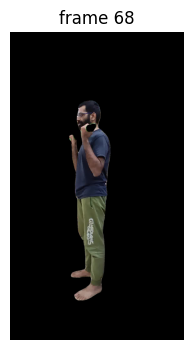

Frame 69, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


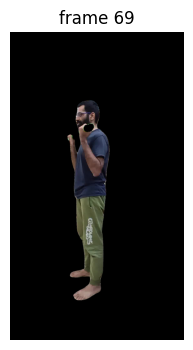

Frame 70, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


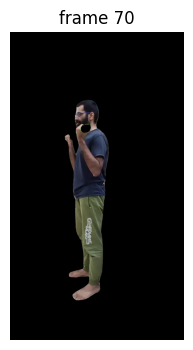

Frame 71, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


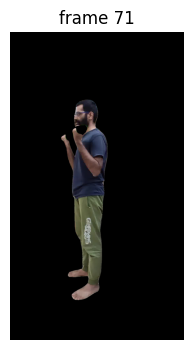

Frame 72, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


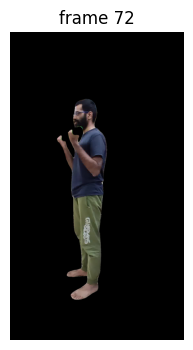

Frame 73, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


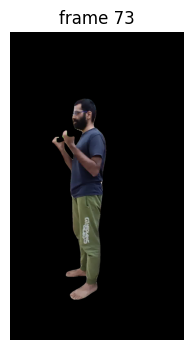

Frame 74, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


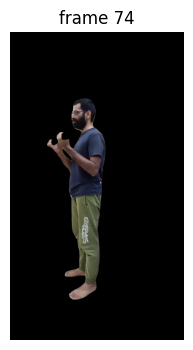

Frame 75, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


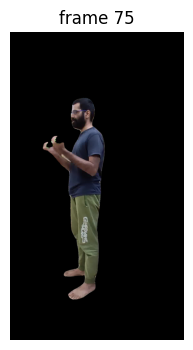

Frame 76, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


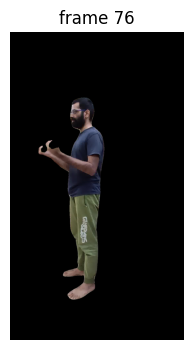

Frame 77, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


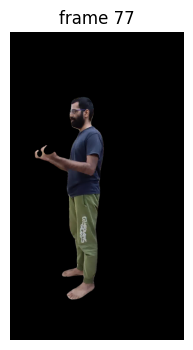

Frame 78, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


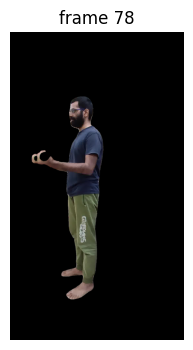

Frame 79, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


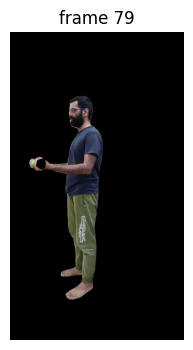

Frame 80, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


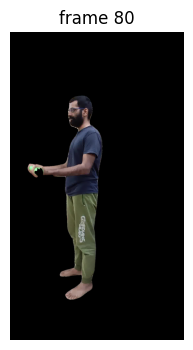

Frame 81, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


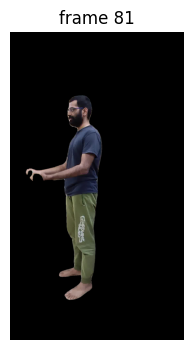

Frame 82, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


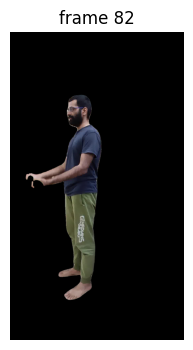

Frame 83, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


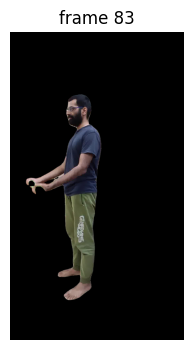

Frame 84, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


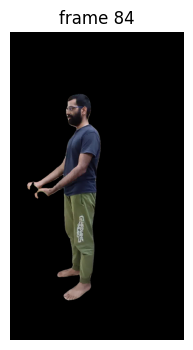

Frame 85, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


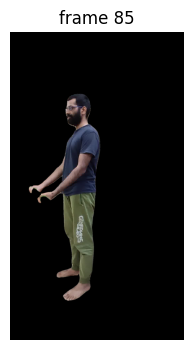

Frame 86, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


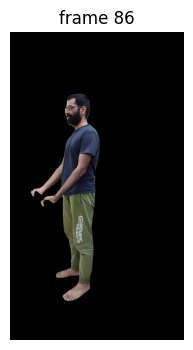

Frame 87, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


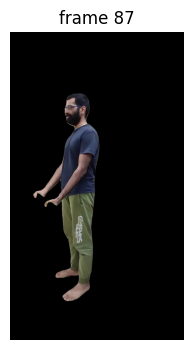

Frame 88, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


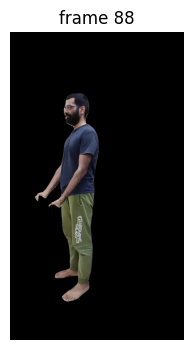

Frame 89, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


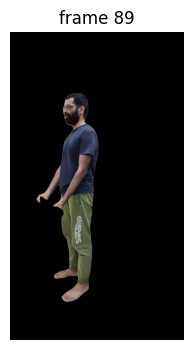

Frame 90, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


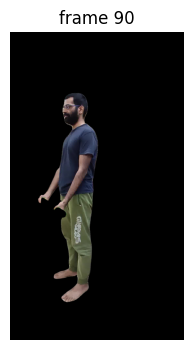

Frame 91, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


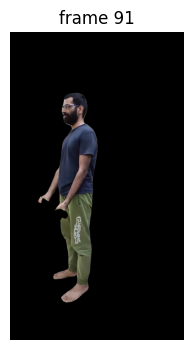

Frame 92, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


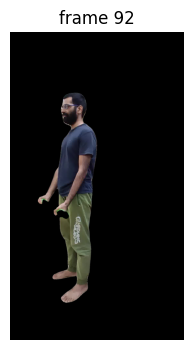

Frame 93, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


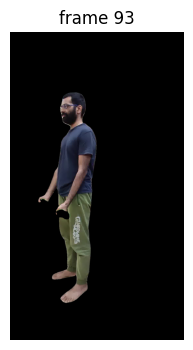

Frame 94, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


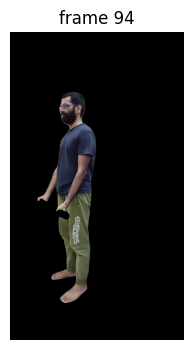

Frame 95, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


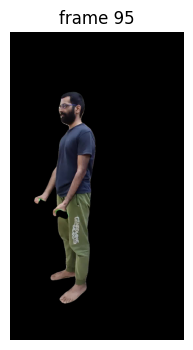

Frame 96, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


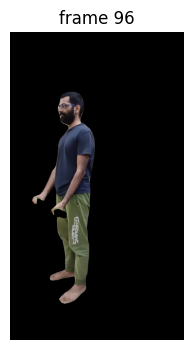

Frame 97, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


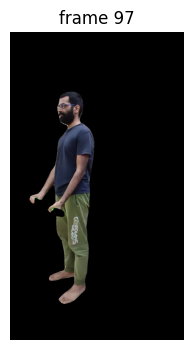

Frame 98, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


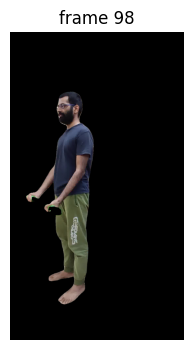

Frame 99, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


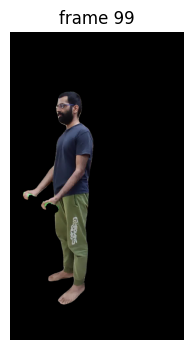

Frame 100, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


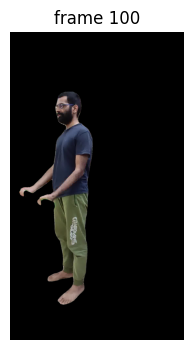

Frame 101, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


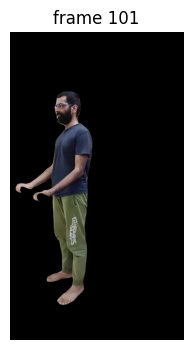

Frame 102, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


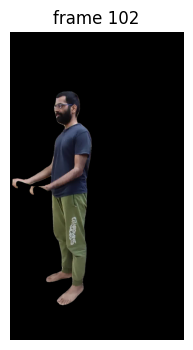

Frame 103, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


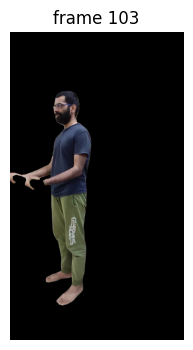

Frame 104, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


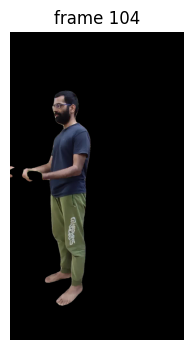

Frame 105, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


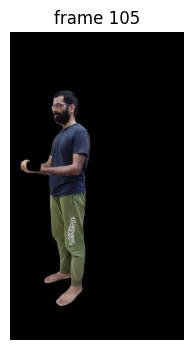

Frame 106, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


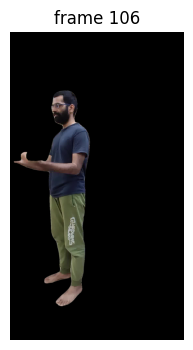

Frame 107, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


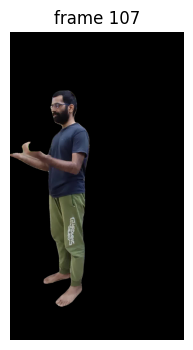

Frame 108, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


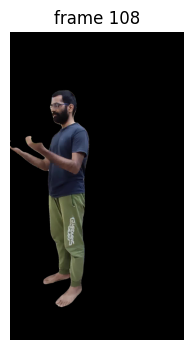

Frame 109, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


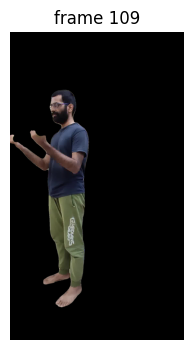

Frame 110, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


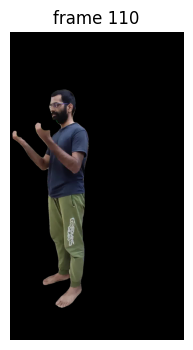

Frame 111, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


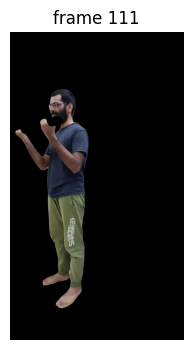

Frame 112, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


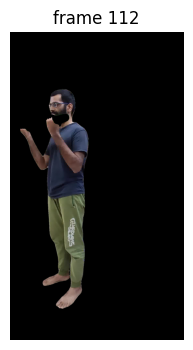

Frame 113, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


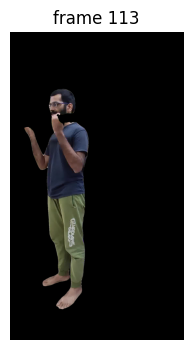

Frame 114, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


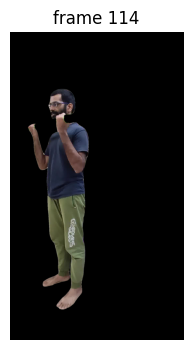

Frame 115, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


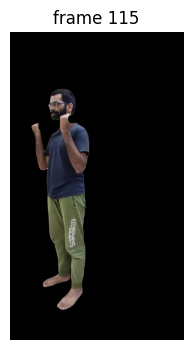

Frame 116, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


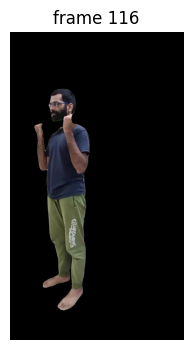

Frame 117, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


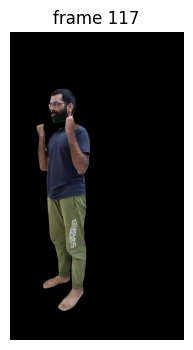

Frame 118, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


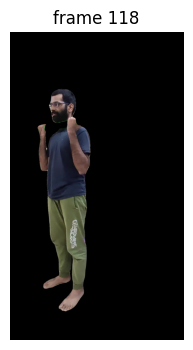

Frame 119, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


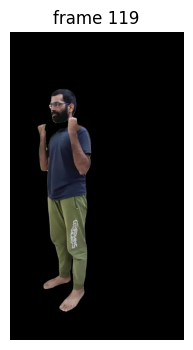

Frame 120, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


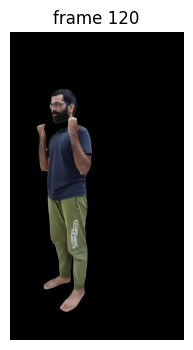

Frame 121, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


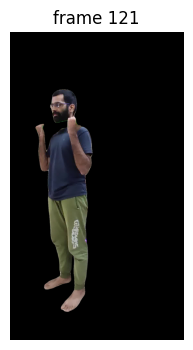

Frame 122, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


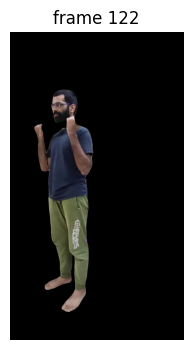

Frame 123, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


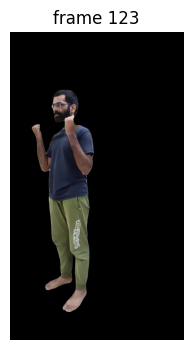

Frame 124, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


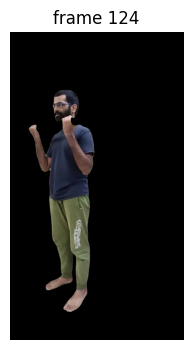

Frame 125, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


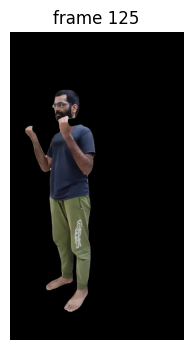

Frame 126, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


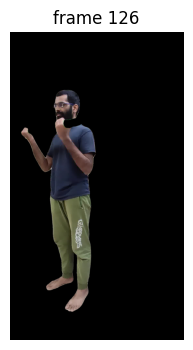

Frame 127, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


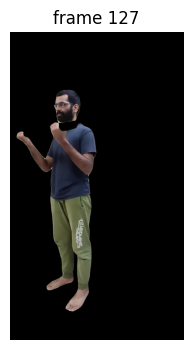

Frame 128, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


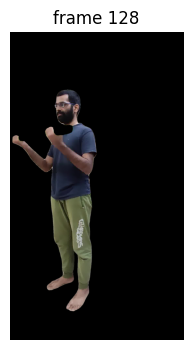

Frame 129, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


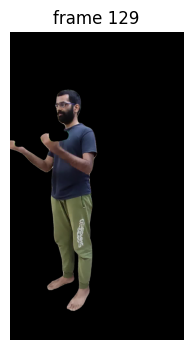

Frame 130, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


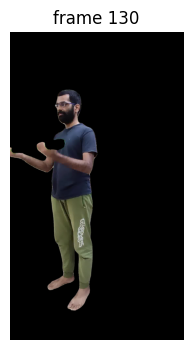

Frame 131, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


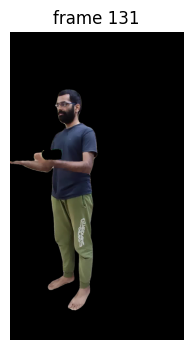

Frame 132, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


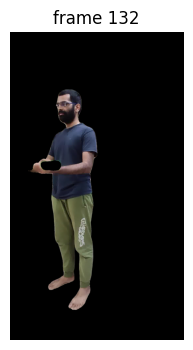

Frame 133, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


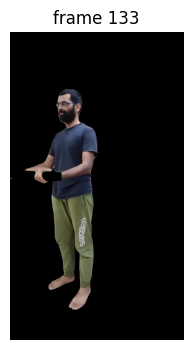

Frame 134, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


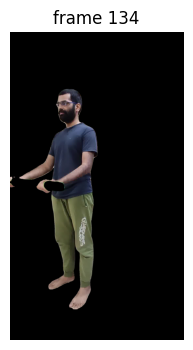

Frame 135, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


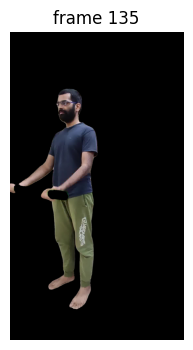

Frame 136, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


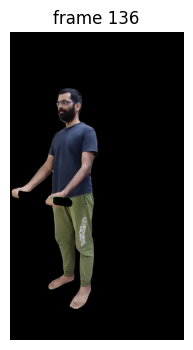

Frame 137, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


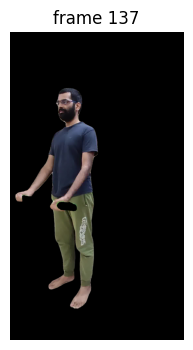

Frame 138, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


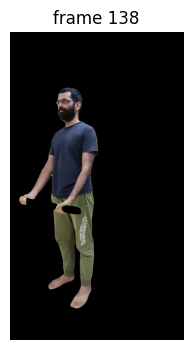

Frame 139, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


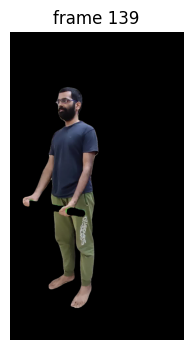

Frame 140, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


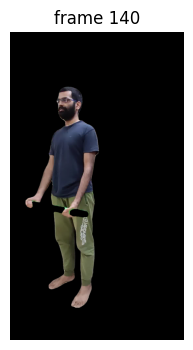

Frame 141, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


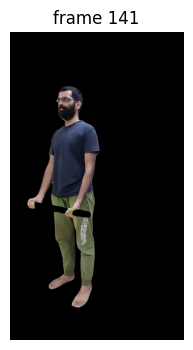

Frame 142, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


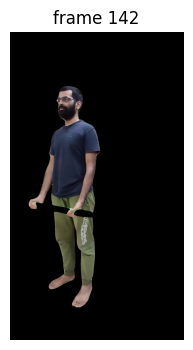

Frame 143, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


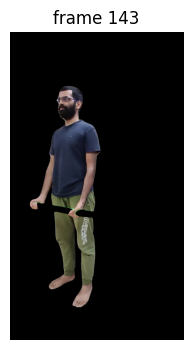

Frame 144, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


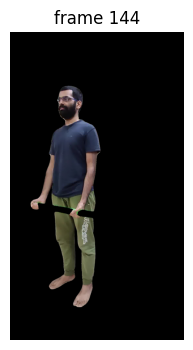

Frame 145, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


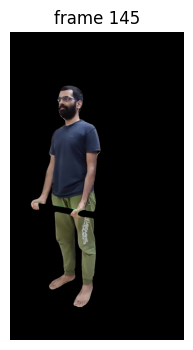

Frame 146, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


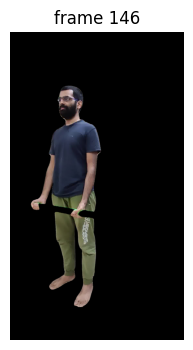

Frame 147, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


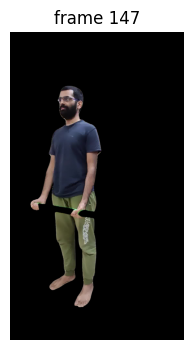

Frame 148, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


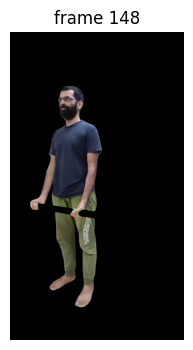

Frame 149, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


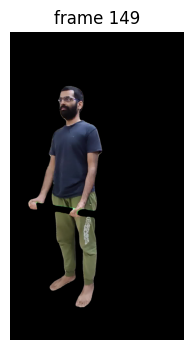

Frame 150, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


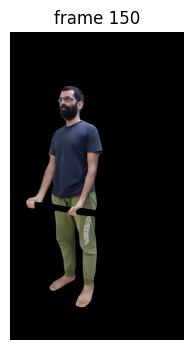

Frame 151, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


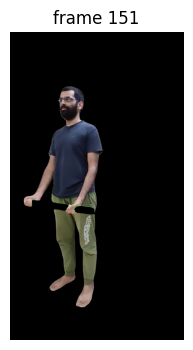

Frame 152, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


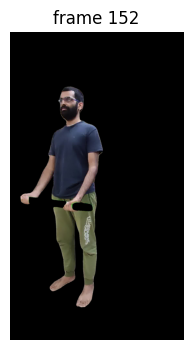

Frame 153, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


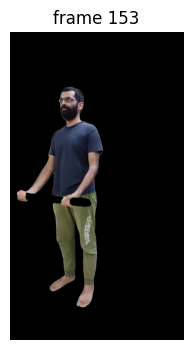

Frame 154, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


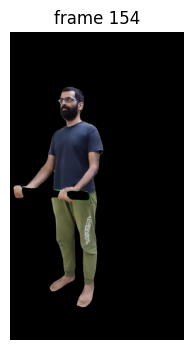

Frame 155, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


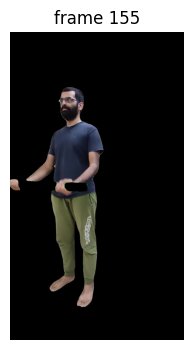

Frame 156, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


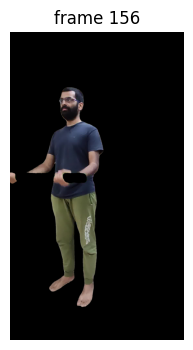

Frame 157, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


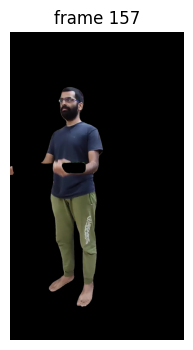

Frame 158, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


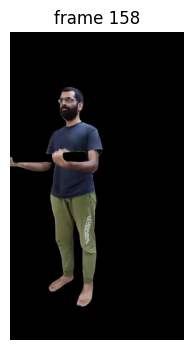

Frame 159, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


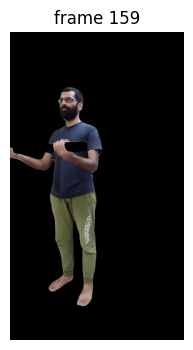

Frame 160, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


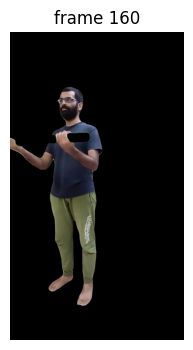

Frame 161, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


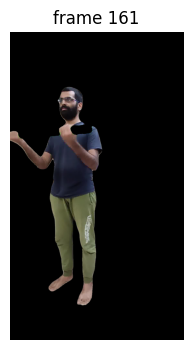

Frame 162, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


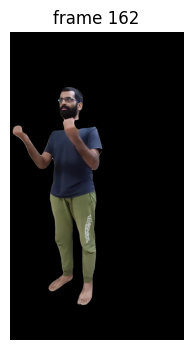

Frame 163, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


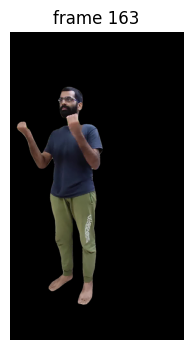

Frame 164, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


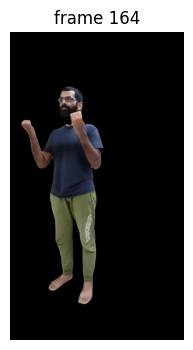

Frame 165, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


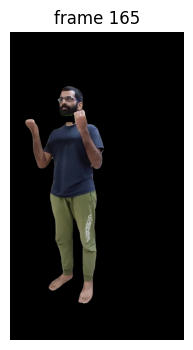

Frame 166, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


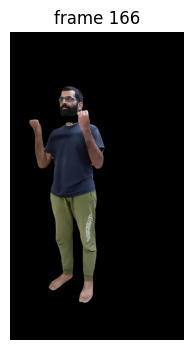

Frame 167, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


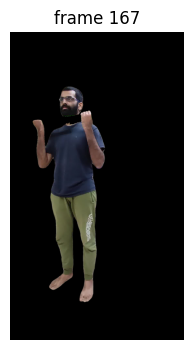

Frame 168, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


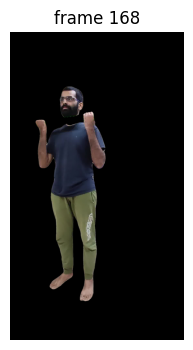

Frame 169, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


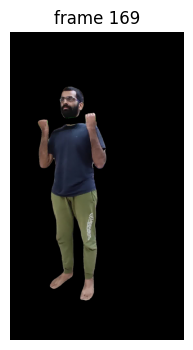

Frame 170, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


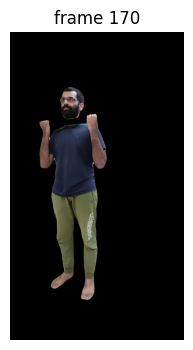

Frame 171, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


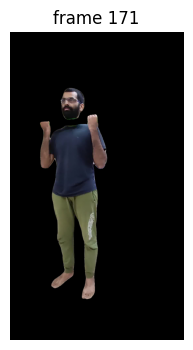

Frame 172, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


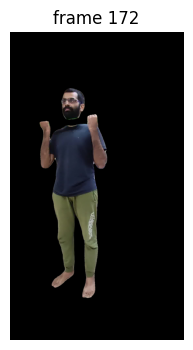

Frame 173, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


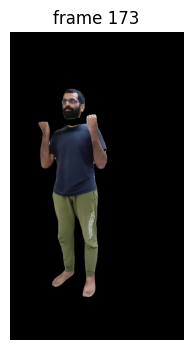

Frame 174, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


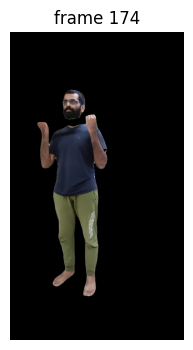

Frame 175, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


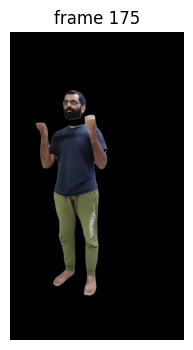

Frame 176, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


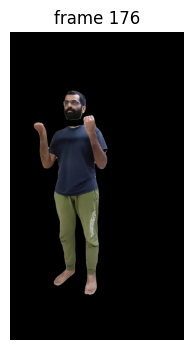

Frame 177, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


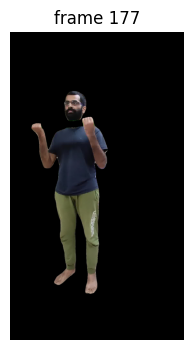

Frame 178, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


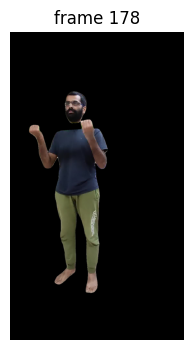

Frame 179, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


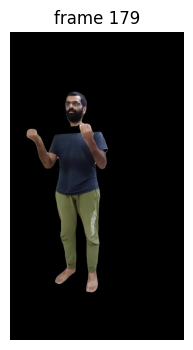

Frame 180, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


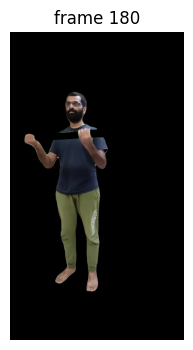

Frame 181, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


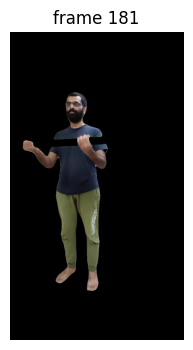

Frame 182, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


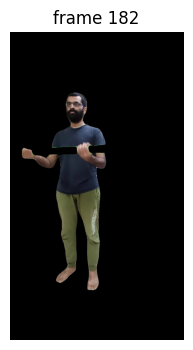

Frame 183, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


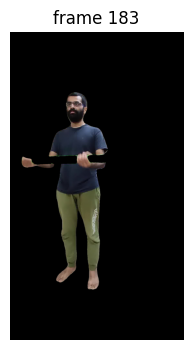

Frame 184, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


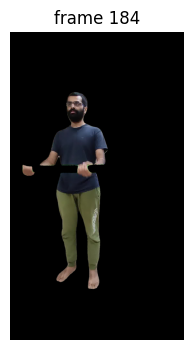

Frame 185, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


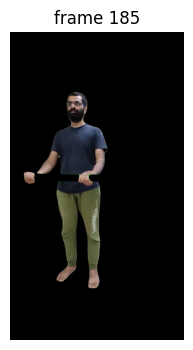

Frame 186, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


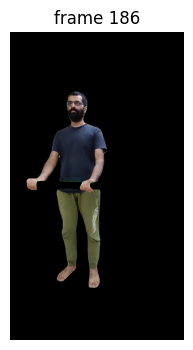

Frame 187, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


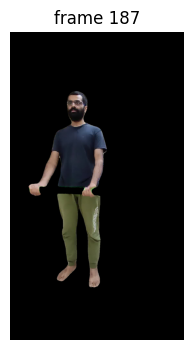

Frame 188, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


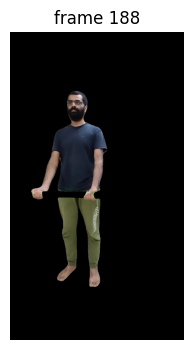

Frame 189, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


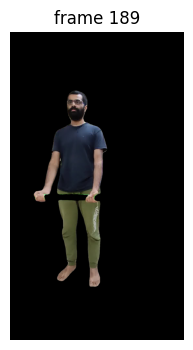

Frame 190, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


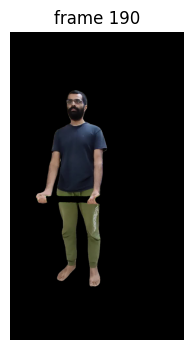

Frame 191, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


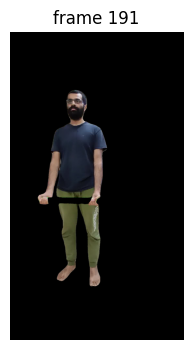

Frame 192, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


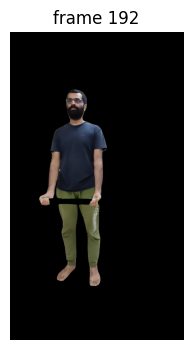

Frame 193, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


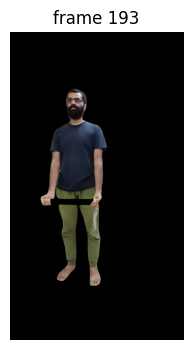

Frame 194, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


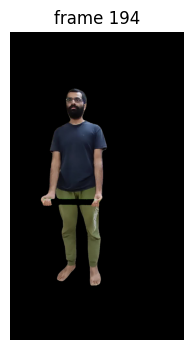

Frame 195, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


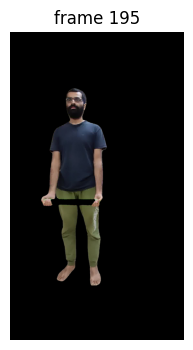

Frame 196, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


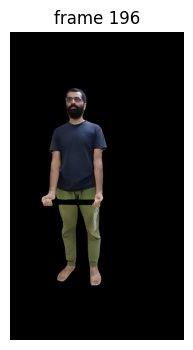

Frame 197, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


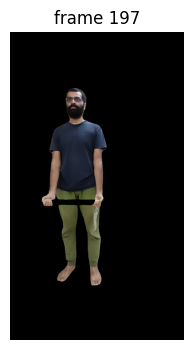

Frame 198, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


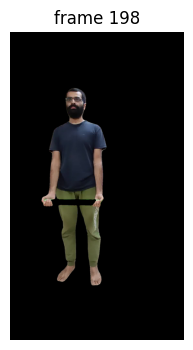

Frame 199, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


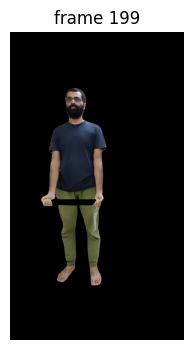

Frame 200, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


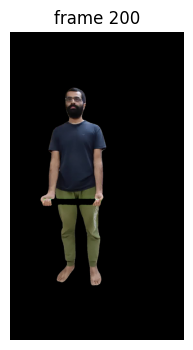

Frame 201, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


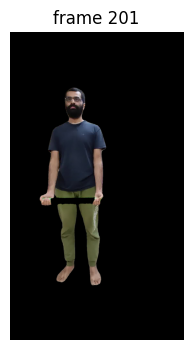

Frame 202, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


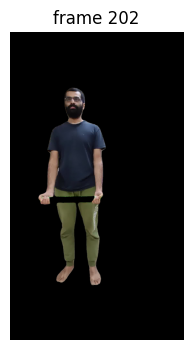

Frame 203, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


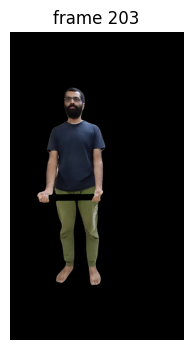

Frame 204, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


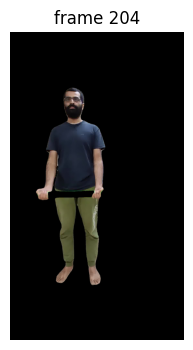

Frame 205, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


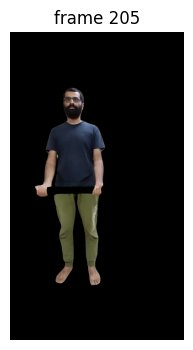

Frame 206, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


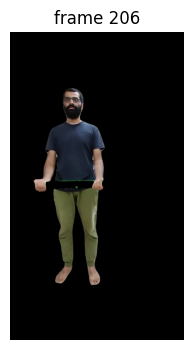

Frame 207, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


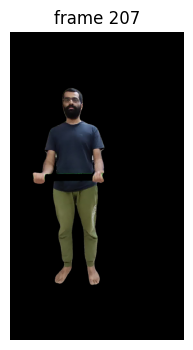

Frame 208, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


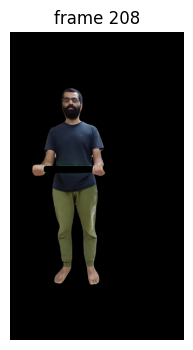

Frame 209, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


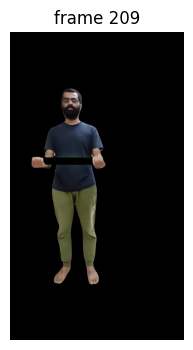

Frame 210, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


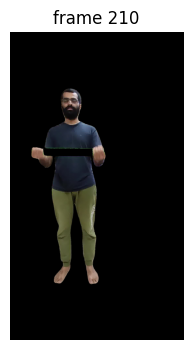

Frame 211, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


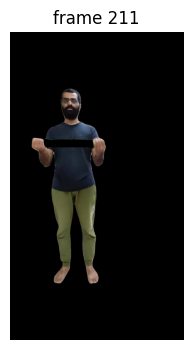

Frame 212, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


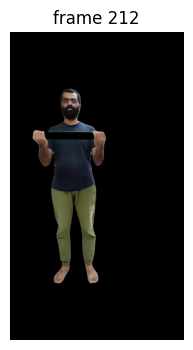

Frame 213, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


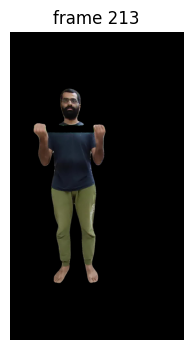

Frame 214, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


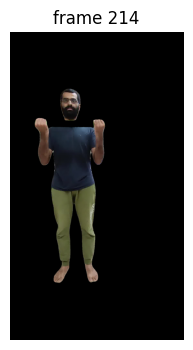

Frame 215, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


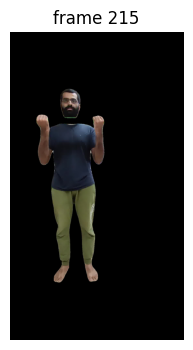

Frame 216, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


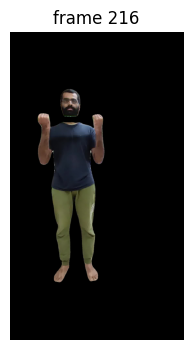

Frame 217, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


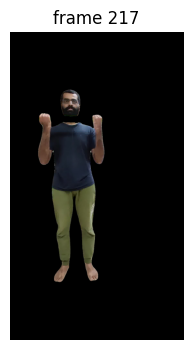

Frame 218, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


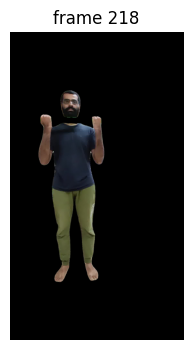

Frame 219, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


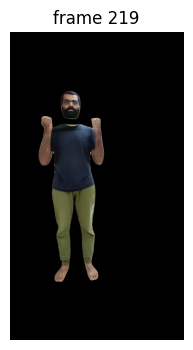

Frame 220, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


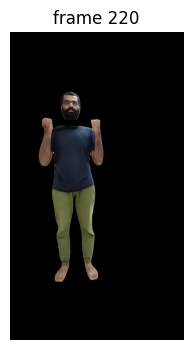

Frame 221, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


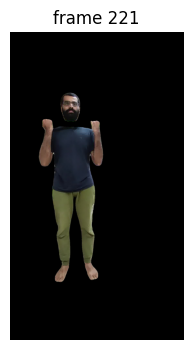

Frame 222, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


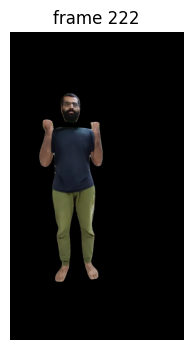

Frame 223, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


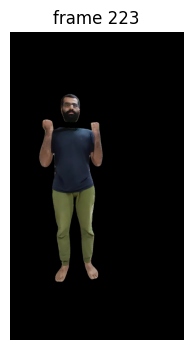

Frame 224, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


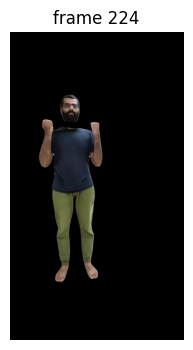

Frame 225, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


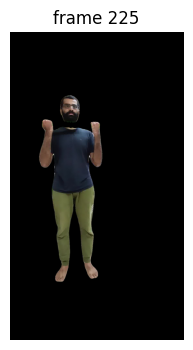

Frame 226, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


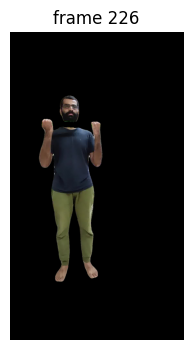

Frame 227, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


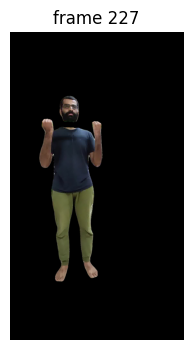

Frame 228, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


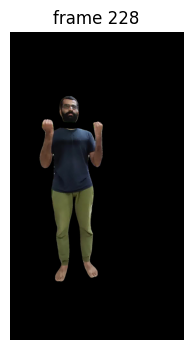

Frame 229, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


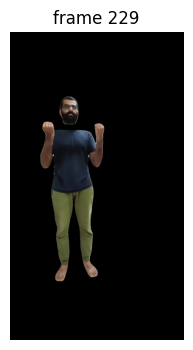

Frame 230, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


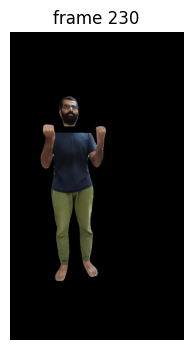

Frame 231, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


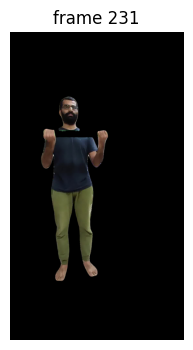

Frame 232, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


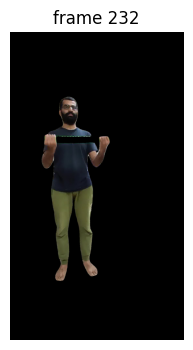

Frame 233, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


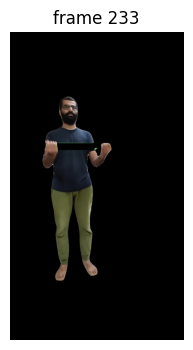

Frame 234, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


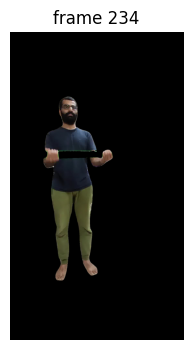

Frame 235, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


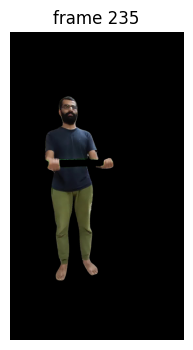

Frame 236, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


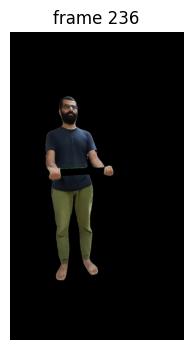

Frame 237, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


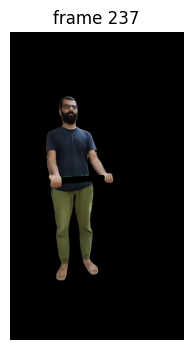

Frame 238, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


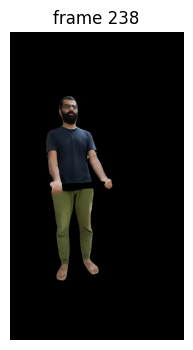

Frame 239, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


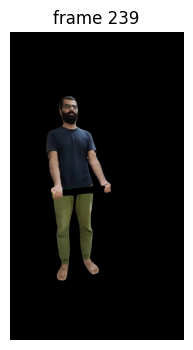

Frame 240, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


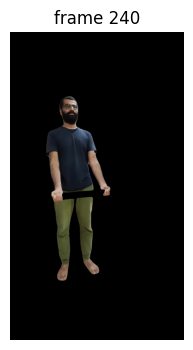

Frame 241, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


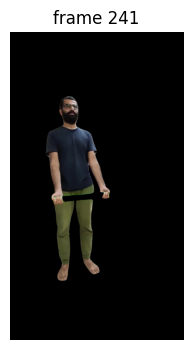

Frame 242, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


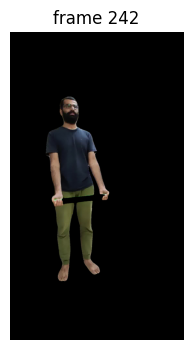

Frame 243, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


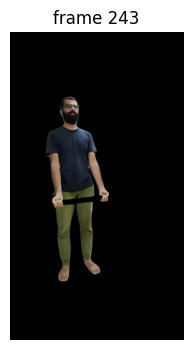

Frame 244, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


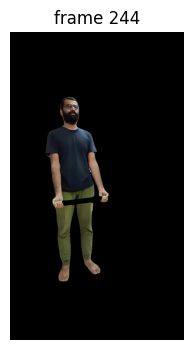

Frame 245, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


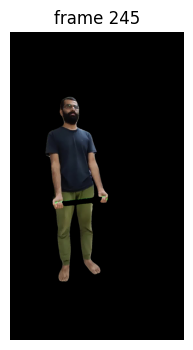

Frame 246, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


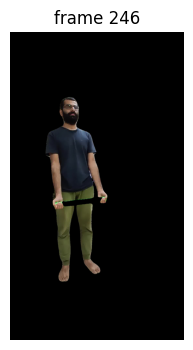

Frame 247, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


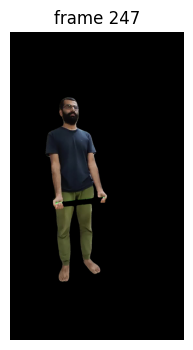

Frame 248, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


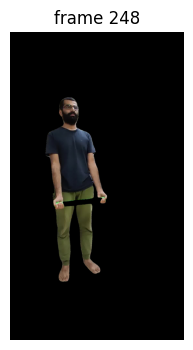

Frame 249, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


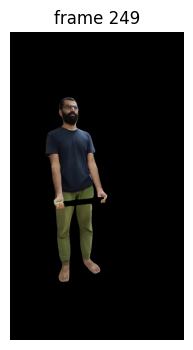

Frame 250, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


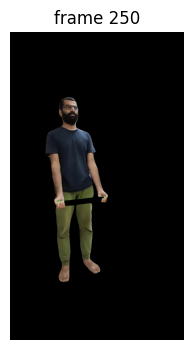

Frame 251, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


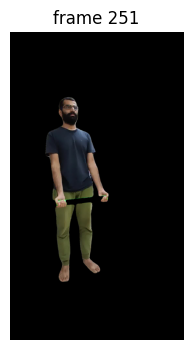

Frame 252, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


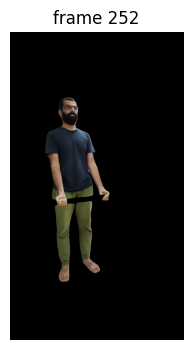

Frame 253, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


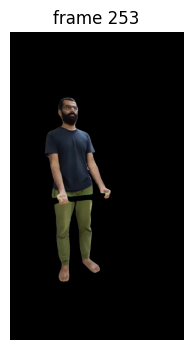

Frame 254, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


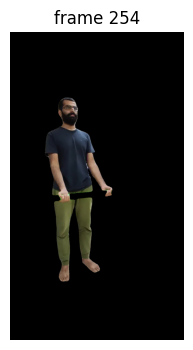

Frame 255, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


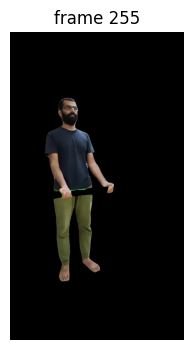

Frame 256, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


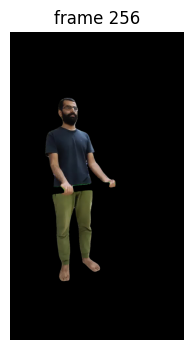

Frame 257, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


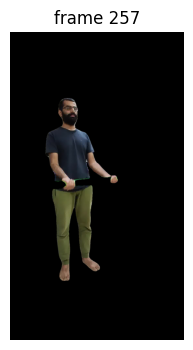

Frame 258, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


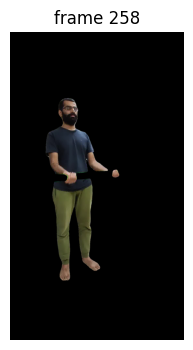

Frame 259, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


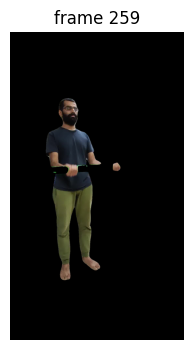

Frame 260, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


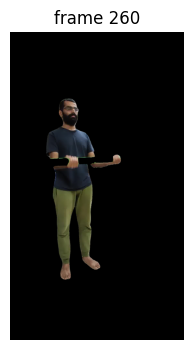

Frame 261, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


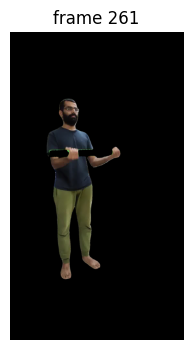

Frame 262, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


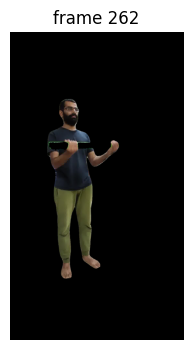

Frame 263, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


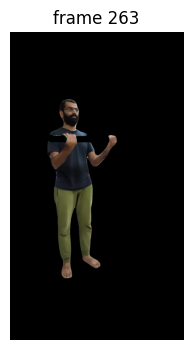

Frame 264, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


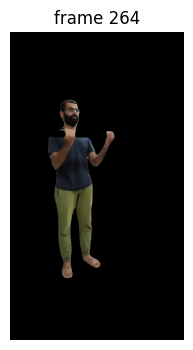

Frame 265, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


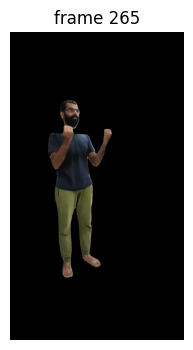

Frame 266, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


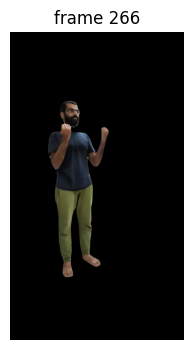

Frame 267, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


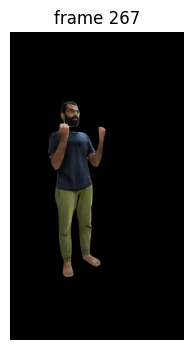

Frame 268, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


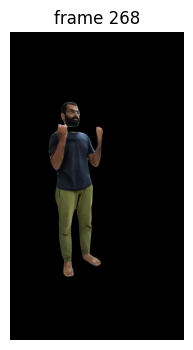

Frame 269, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


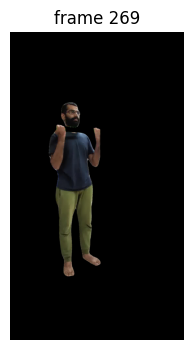

Frame 270, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


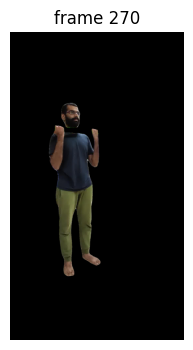

Frame 271, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


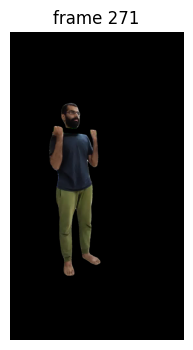

Frame 272, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


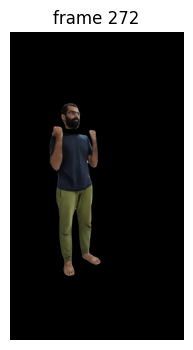

Frame 273, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


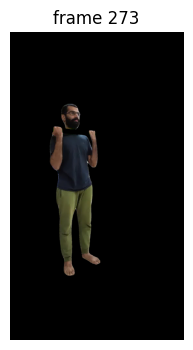

Frame 274, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


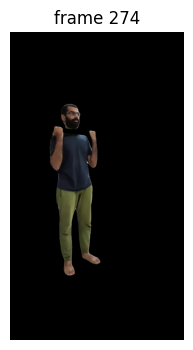

Frame 275, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


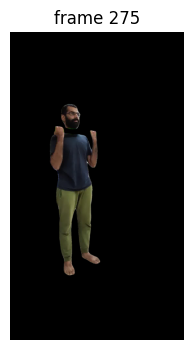

Frame 276, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


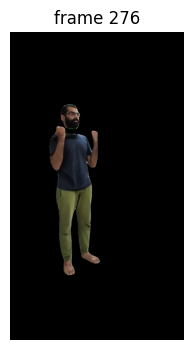

Frame 277, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


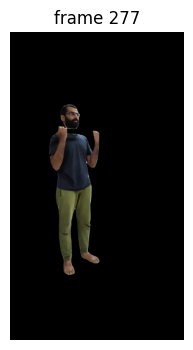

Frame 278, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


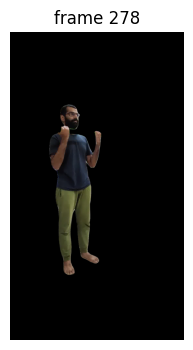

Frame 279, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


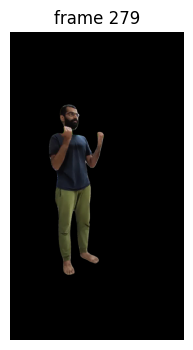

Frame 280, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


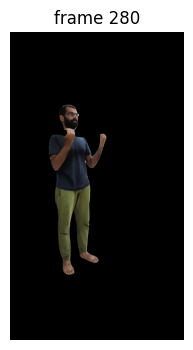

Frame 281, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


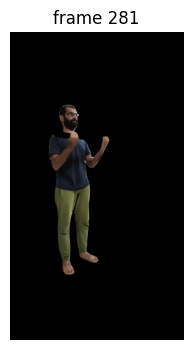

Frame 282, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


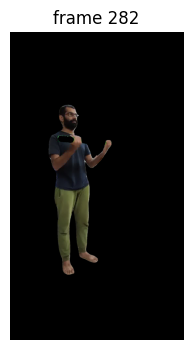

Frame 283, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


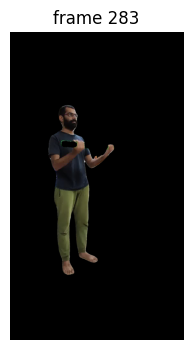

Frame 284, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


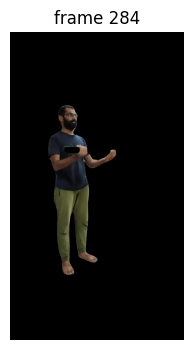

Frame 285, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


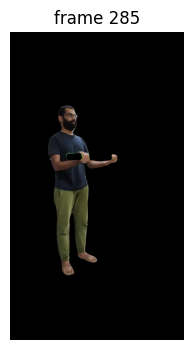

Frame 286, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


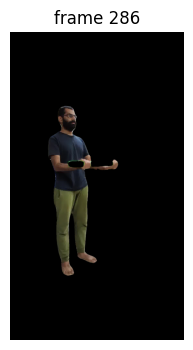

Frame 287, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


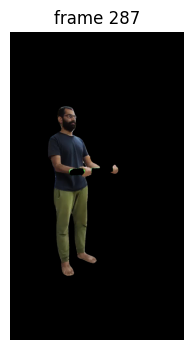

Frame 288, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


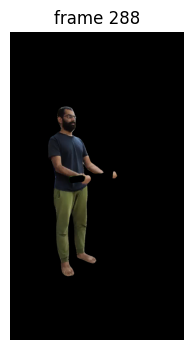

Frame 289, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


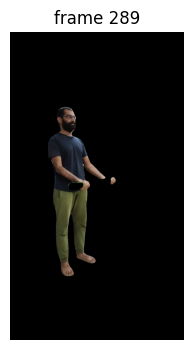

Frame 290, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


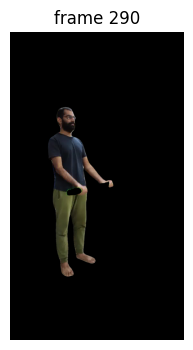

Frame 291, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


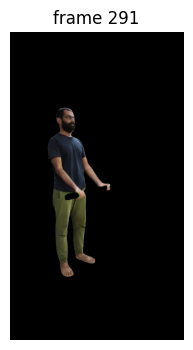

Frame 292, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


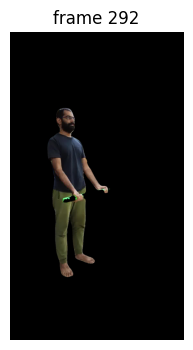

Frame 293, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


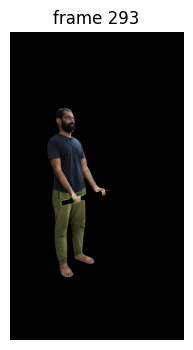

Frame 294, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


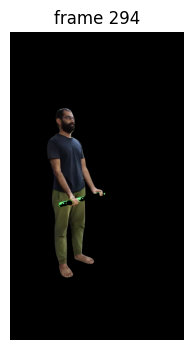

Frame 295, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


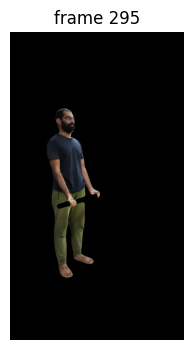

Frame 296, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


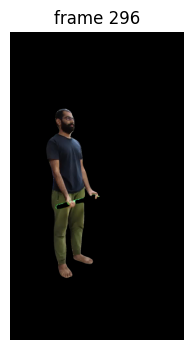

Frame 297, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


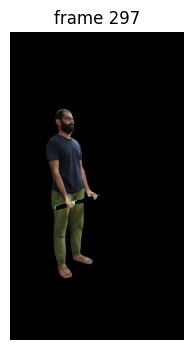

Frame 298, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


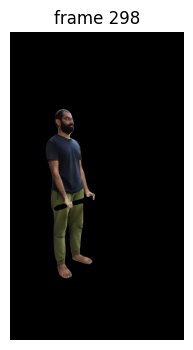

Frame 299, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


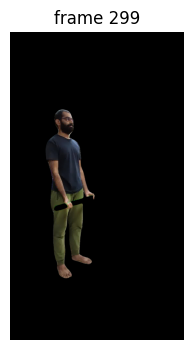

Frame 300, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


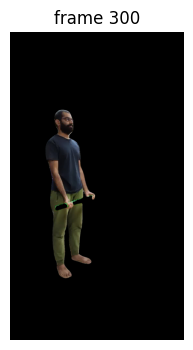

Frame 301, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


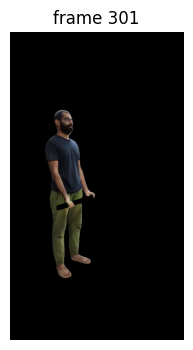

Frame 302, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


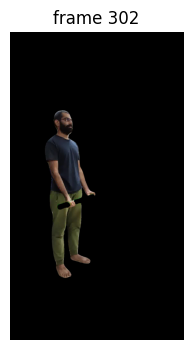

Frame 303, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


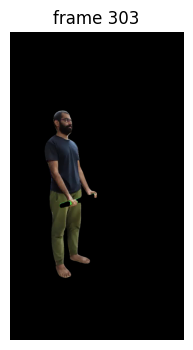

Frame 304, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


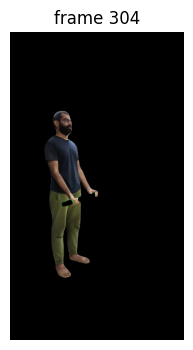

Frame 305, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


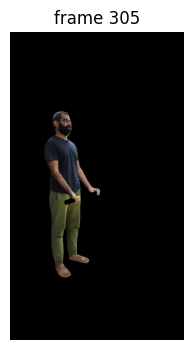

Frame 306, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


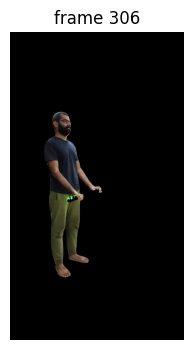

Frame 307, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


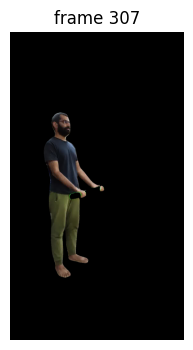

Frame 308, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


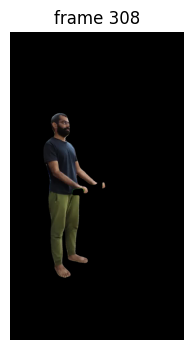

Frame 309, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


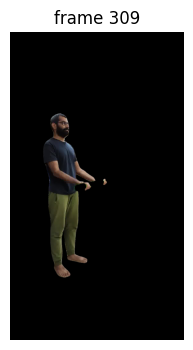

Frame 310, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


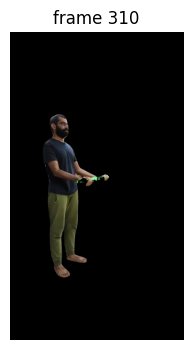

Frame 311, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


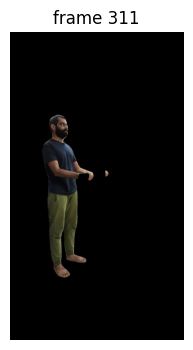

Frame 312, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


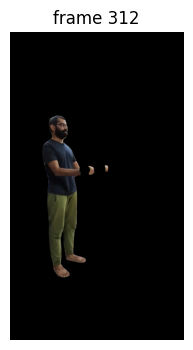

Frame 313, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


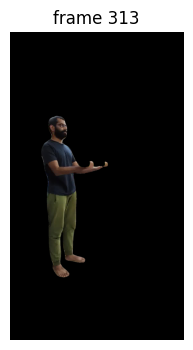

Frame 314, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


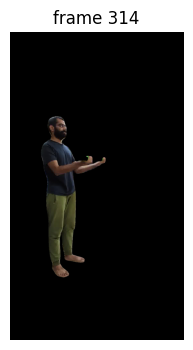

Frame 315, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


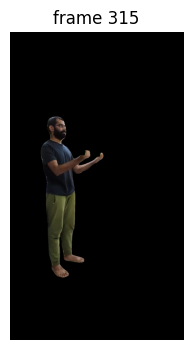

Frame 316, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


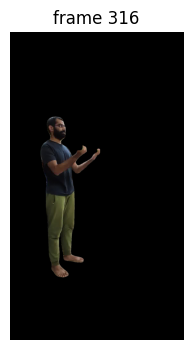

Frame 317, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


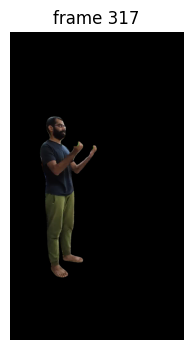

Frame 318, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


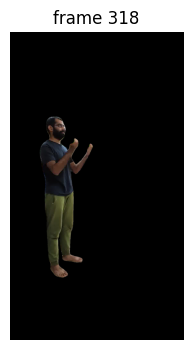

Frame 319, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


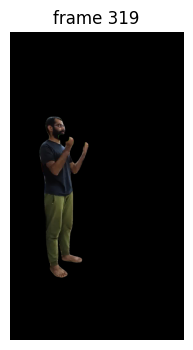

Frame 320, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


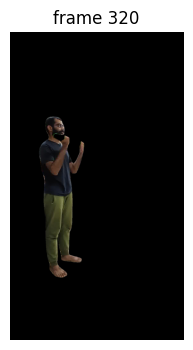

Frame 321, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


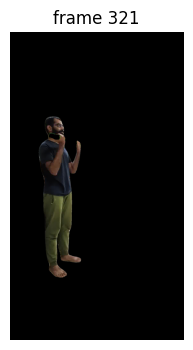

Frame 322, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


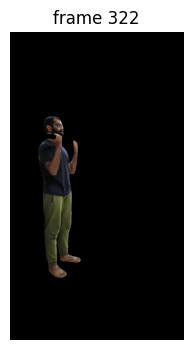

Frame 323, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


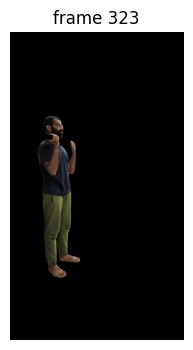

Frame 324, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


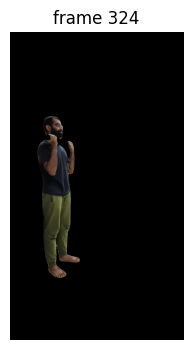

Frame 325, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


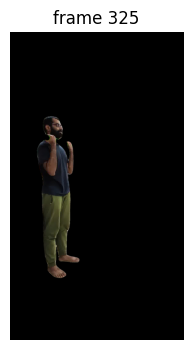

Frame 326, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


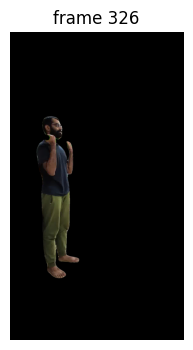

Frame 327, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


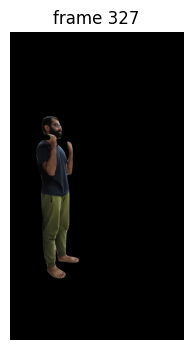

Frame 328, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


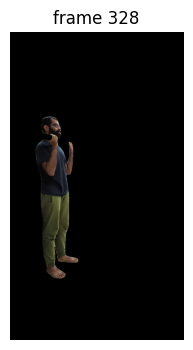

Frame 329, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


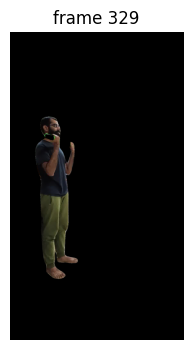

Frame 330, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


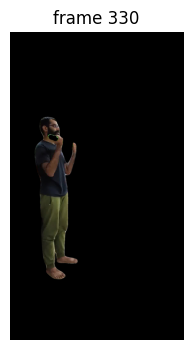

Frame 331, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


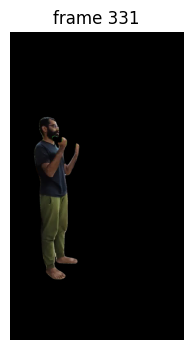

Frame 332, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


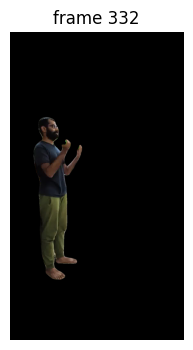

Frame 333, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


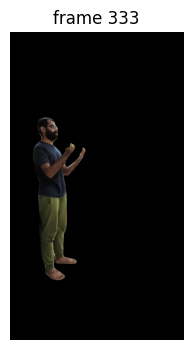

Frame 334, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


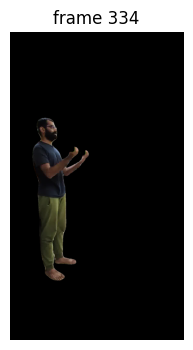

Frame 335, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


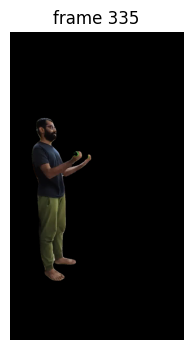

Frame 336, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


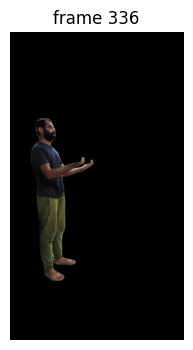

Frame 337, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


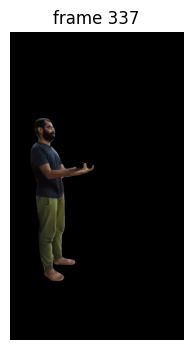

Frame 338, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


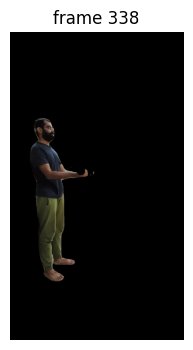

Frame 339, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


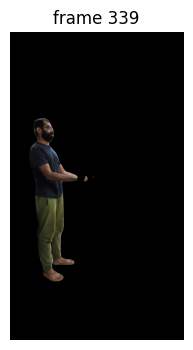

Frame 340, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


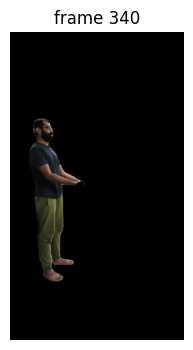

Frame 341, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


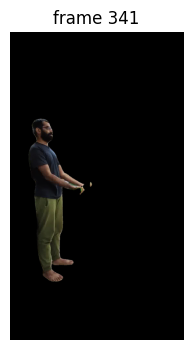

Frame 342, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


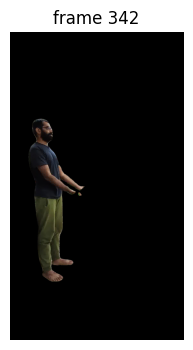

Frame 343, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


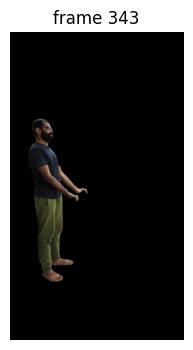

Frame 344, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


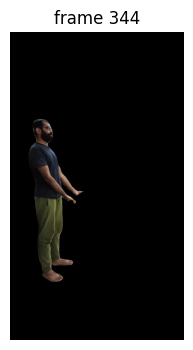

Frame 345, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


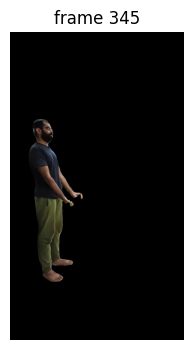

Frame 346, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


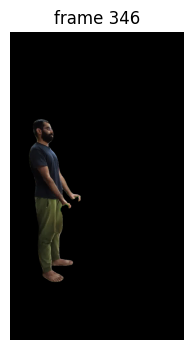

Frame 347, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


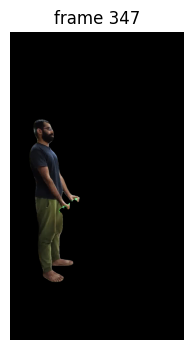

Frame 348, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


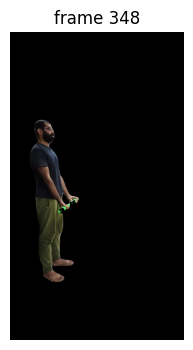

Frame 349, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


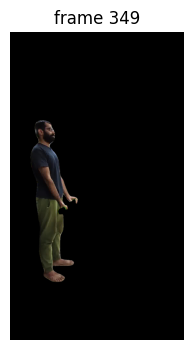

Frame 350, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


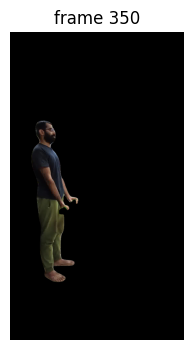

Frame 351, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


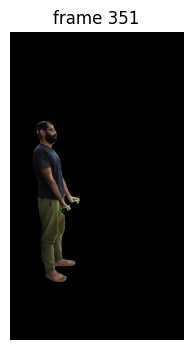

Frame 352, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


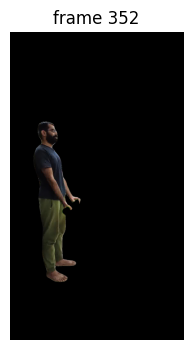

Frame 353, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


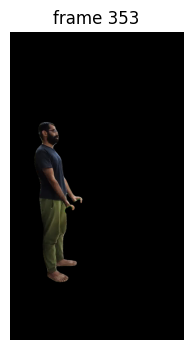

Frame 354, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


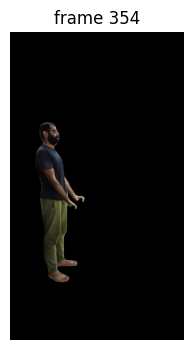

Frame 355, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


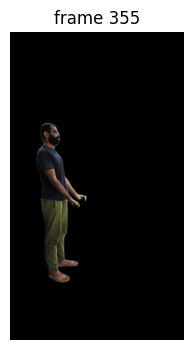

Frame 356, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


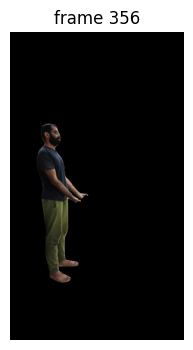

Frame 357, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


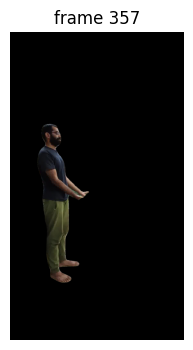

Frame 358, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


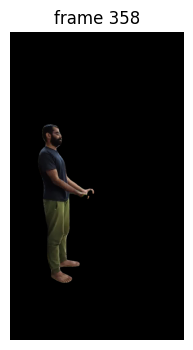

Frame 359, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


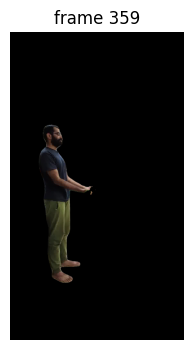

Frame 360, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


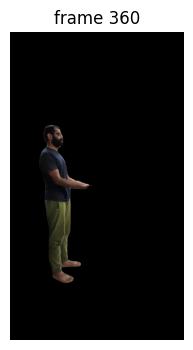

Frame 361, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


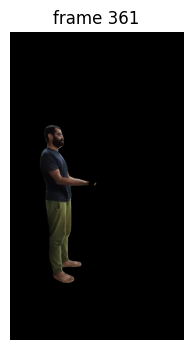

Frame 362, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


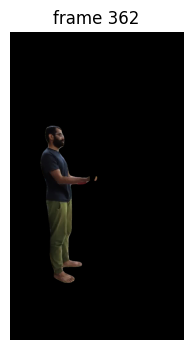

Frame 363, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


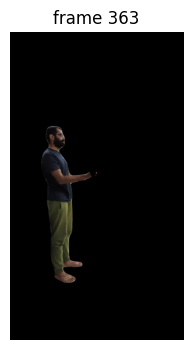

Frame 364, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


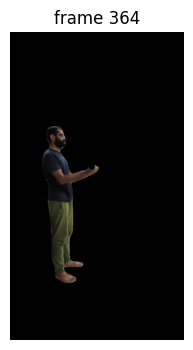

Frame 365, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


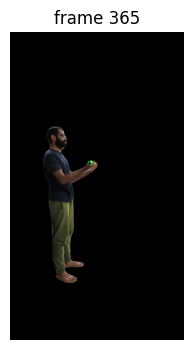

Frame 366, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


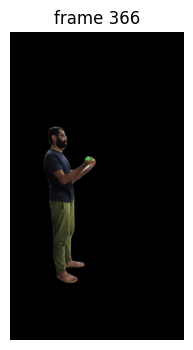

Frame 367, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


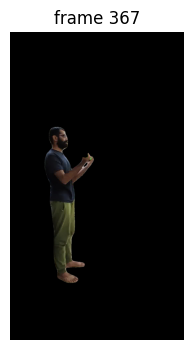

Frame 368, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


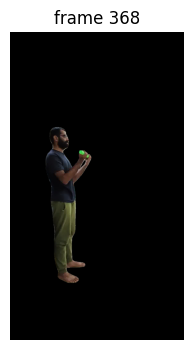

Frame 369, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


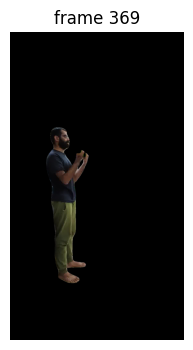

Frame 370, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


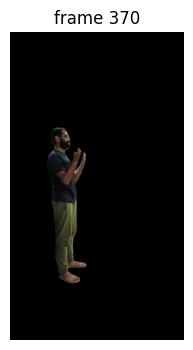

Frame 371, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


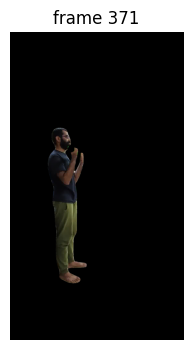

Frame 372, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


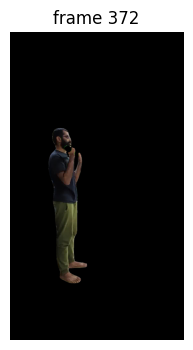

Frame 373, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


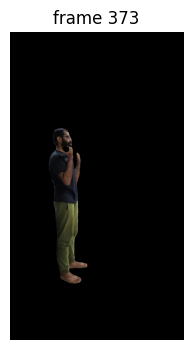

Frame 374, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


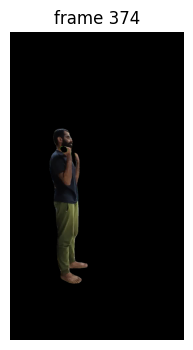

Frame 375, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


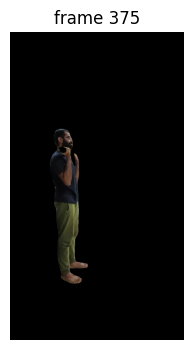

Frame 376, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


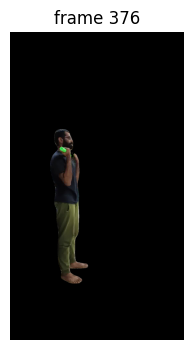

Frame 377, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


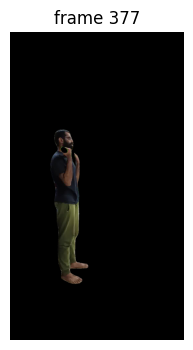

Frame 378, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


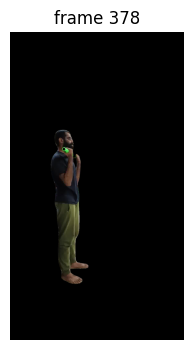

Frame 379, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


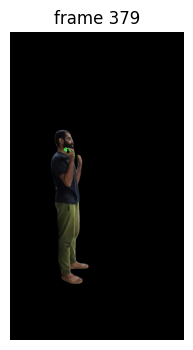

Frame 380, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


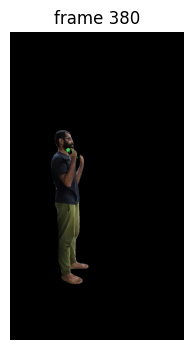

Frame 381, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


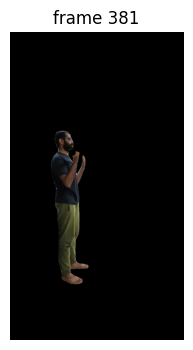

Frame 382, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


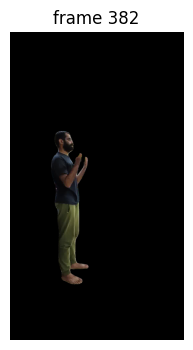

Frame 383, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


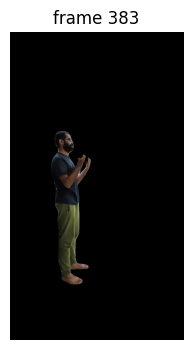

Frame 384, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


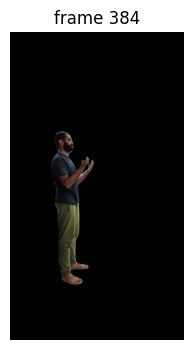

Frame 385, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


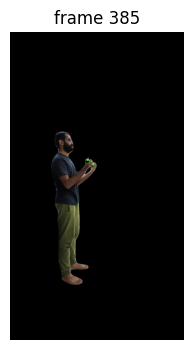

Frame 386, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


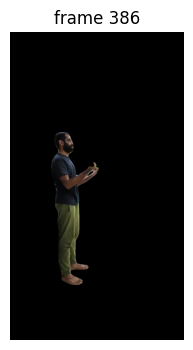

Frame 387, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


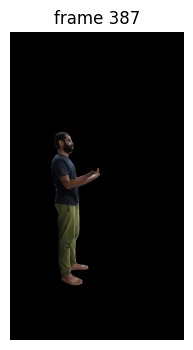

Frame 388, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


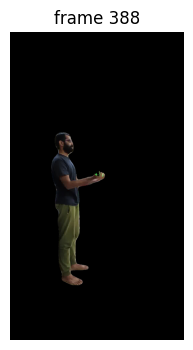

Frame 389, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


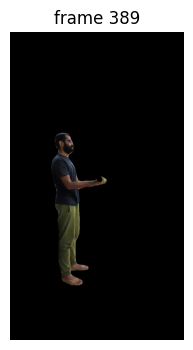

Frame 390, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


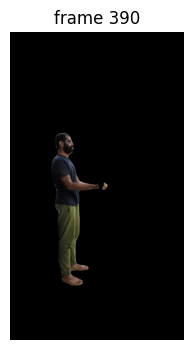

Frame 391, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


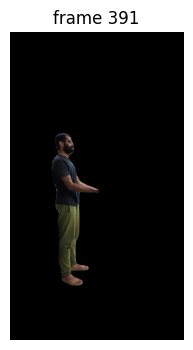

Frame 392, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


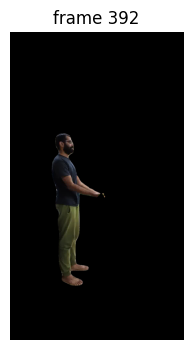

Frame 393, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


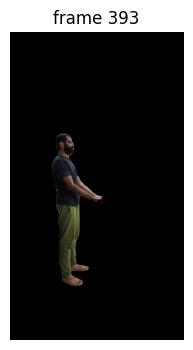

Frame 394, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


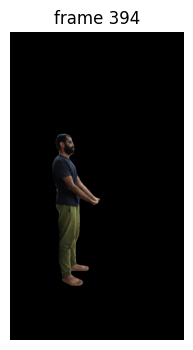

Frame 395, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


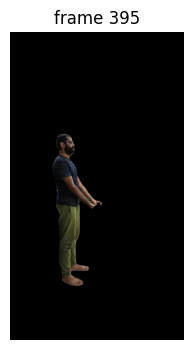

Frame 396, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


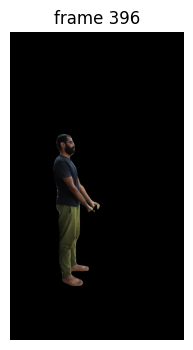

Frame 397, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


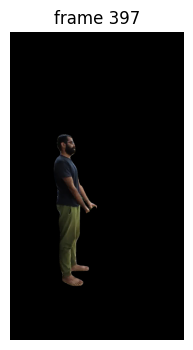

Frame 398, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


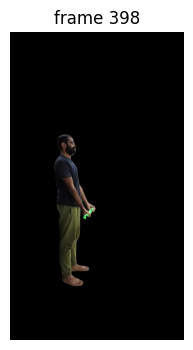

Frame 399, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


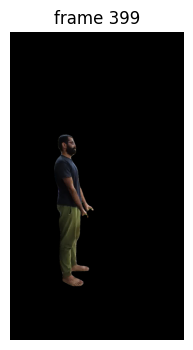

Frame 400, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


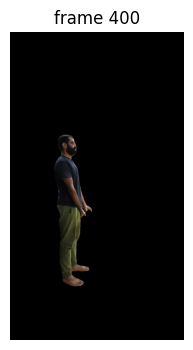

Frame 401, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


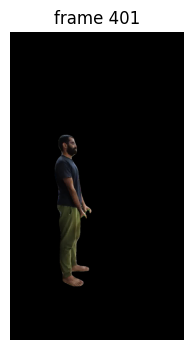

Frame 402, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


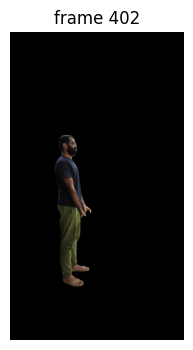

Frame 403, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


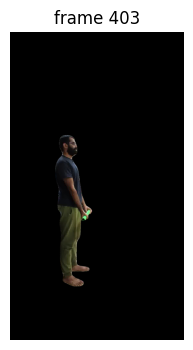

Frame 404, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


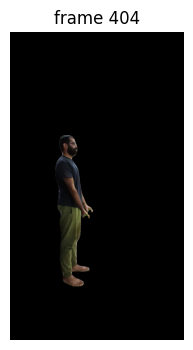

Frame 405, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


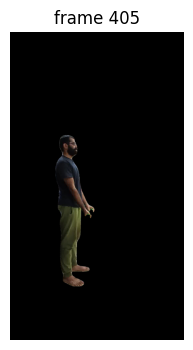

Frame 406, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


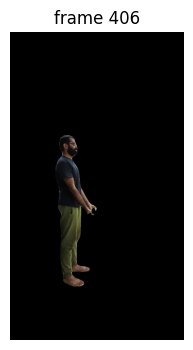

Frame 407, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


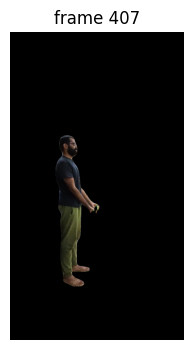

Frame 408, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


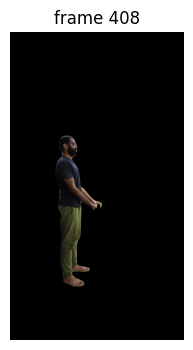

Frame 409, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


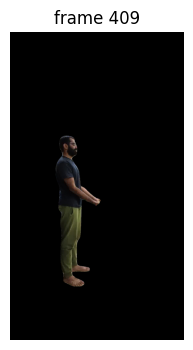

Frame 410, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


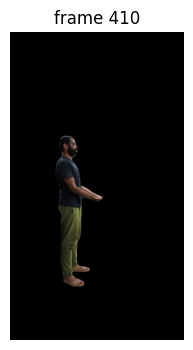

Frame 411, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


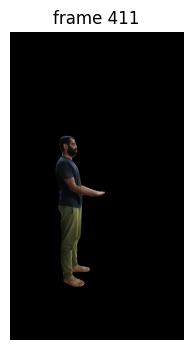

Frame 412, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


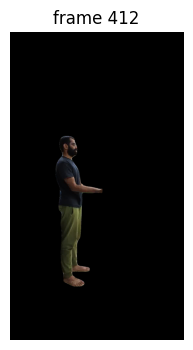

Frame 413, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


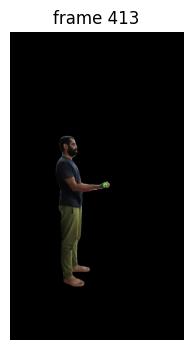

Frame 414, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


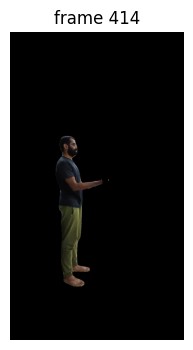

Frame 415, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


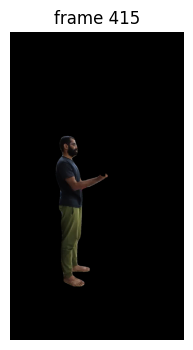

Frame 416, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


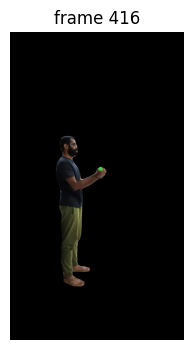

Frame 417, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


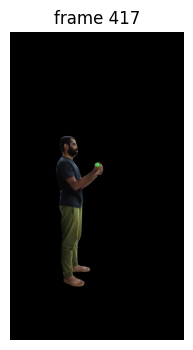

Frame 418, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


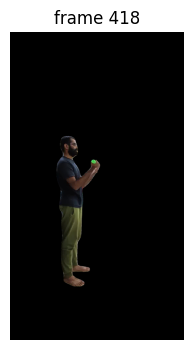

Frame 419, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


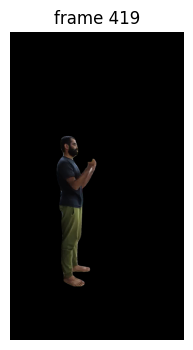

Frame 420, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


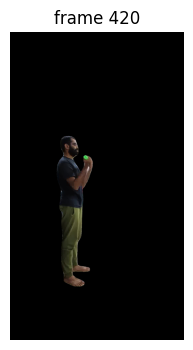

Frame 421, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


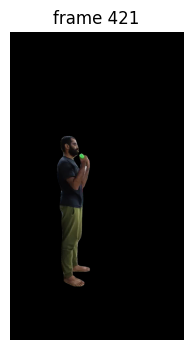

Frame 422, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


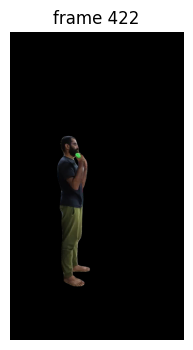

Frame 423, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


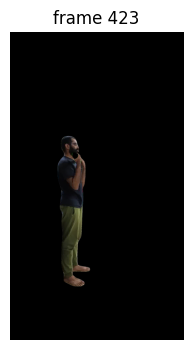

Frame 424, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


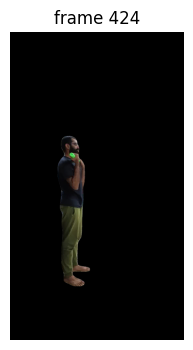

Frame 425, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


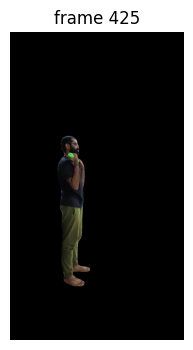

Frame 426, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


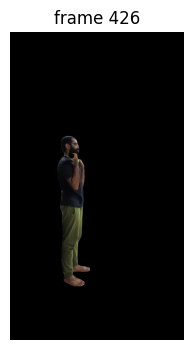

Frame 427, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


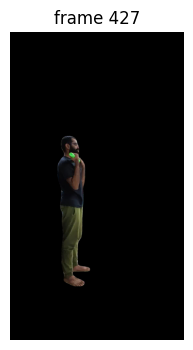

Frame 428, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


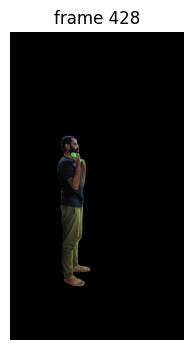

Frame 429, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


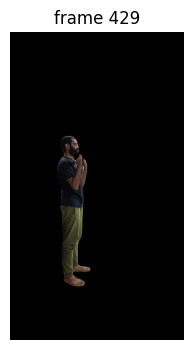

Frame 430, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


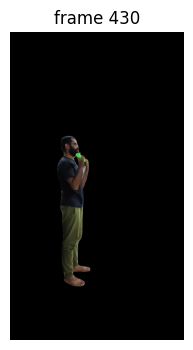

Frame 431, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


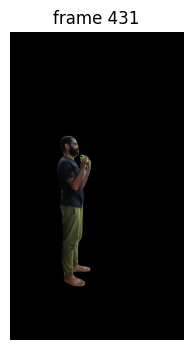

Frame 432, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


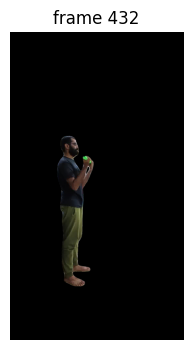

Frame 433, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


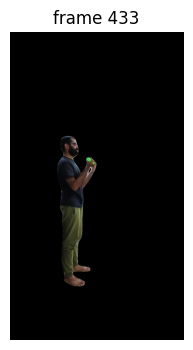

Frame 434, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


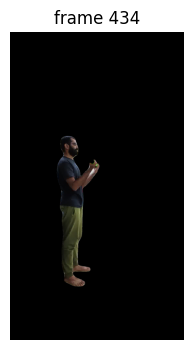

Frame 435, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


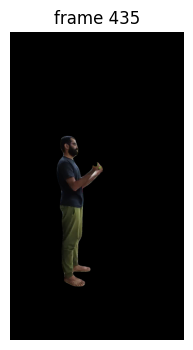

Frame 436, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


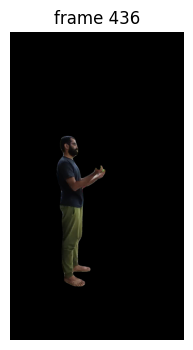

Frame 437, Object 4 - Mask shape: (1, 1920, 1080), Frame shape: (1920, 1080, 3)


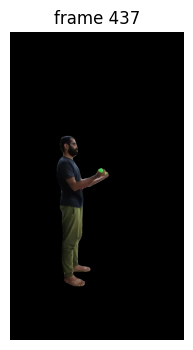

In [26]:
import numpy as np
import os
from PIL import Image
import matplotlib.pyplot as plt

# Set up the output directory for segmented frames
output_dir = "segmented_frames_Exercise1"
os.makedirs(output_dir, exist_ok=True)

# # Run propagation throughout the video and collect the results in a dict
# video_segments = {}  # video_segments contains the per-frame segmentation results
# for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
#     video_segments[out_frame_idx] = {
#         out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
#         for i, out_obj_id in enumerate(out_obj_ids)
#     }

# Render the segmentation results and save them as individual images
vis_frame_stride = 1  # Process every frame
for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
    # Load the frame image
    frame_path = os.path.join(video_dir, frame_names[out_frame_idx])
    frame_image = np.array(Image.open(frame_path))

    # Loop through each object in the current frame's segmentation results
    for out_obj_id, out_mask in video_segments[out_frame_idx].items():
        # Debugging: Check the shape of the mask and the frame
        print(f"Frame {out_frame_idx}, Object {out_obj_id} - Mask shape: {out_mask.shape}, Frame shape: {frame_image.shape}")

        # Squeeze the mask to remove the extra dimension
        out_mask = out_mask.squeeze()  # Remove the extra dimension, making it (1920, 1080)

        # Ensure the mask has the correct shape (should match the frame dimensions)
        if out_mask.shape != frame_image.shape[:2]:
            raise ValueError(f"Mask shape {out_mask.shape} does not match frame shape {frame_image.shape[:2]}")

        # Create a blank image with the same shape as the original frame
        segmented_image = np.zeros_like(frame_image)

        # Apply the mask to extract the segmented object from the original image
        segmented_image[out_mask] = frame_image[out_mask]

        # Convert the array back to an image
        segmented_image_pil = Image.fromarray(segmented_image)

        # Save the segmented image
        filename = f"{out_frame_idx:05d}.jpg"
        segmented_image_pil.save(os.path.join(output_dir, filename))

    # Optionally: You can display the segmented image to verify visually, if needed
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(segmented_image_pil)
    plt.axis('off')  # Hide axes for better visualization
    plt.show()

Note that in addition to clicks or boxes, SAM 2 also supports directly using a **mask prompt** as input via the `add_new_mask` method in the `SAM2VideoPredictor` class. This can be helpful in e.g. semi-supervised VOS evaluations (see [tools/vos_inference.py](https://github.com/facebookresearch/sam2/blob/main/tools/vos_inference.py) for an example).

# Python Code to Convert Segmented Images into a Video:

In [27]:
!apt-get install ffmpeg


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
ffmpeg is already the newest version (7:4.4.2-0ubuntu0.22.04.1).
0 upgraded, 0 newly installed, 0 to remove and 29 not upgraded.


In [28]:
import os
import subprocess

# Set the path to the segmented frames
segmented_frames_dir = "segmented_frames_Exercise1"

# Set the output video file path
output_video_path = "segmented_videos/Exercise1_segmented.mp4"

# Set the frame rate (e.g., 30 frames per second)
frame_rate = 30

# Generate the command for ffmpeg to create a video from the images
ffmpeg_command = [
    "ffmpeg",
    "-framerate", str(frame_rate),            # Set frame rate
    "-i", os.path.join(output_dir, "%05d.jpg"),  # Input image sequence with zero-padded filenames
    "-c:v", "libx264",                         # Use libx264 codec for video compression
    "-r", str(frame_rate),                     # Set frame rate (again, for output video)
    "-pix_fmt", "yuv420p",                     # Set pixel format (required for compatibility with most players)
    output_video_path                           # Output video file path
]

# Run the ffmpeg command
subprocess.run(ffmpeg_command)

print(f"Video saved to {output_video_path}")


Video saved to segmented_videos/Exercise1_segmented.mp4


### Example 3: Segment multiple objects simultaneously

Note: if you have run any previous tracking using this `inference_state`, please reset it first via `reset_state`.

In [ ]:
predictor.reset_state(inference_state)

#### Step 1: Add two objects on a frame

SAM 2 can also segment and track two or more objects at the same time. One way, of course, is to do them one by one. However, it would be more efficient to batch them together (e.g. so that we can share the image features between objects to reduce computation costs).

This time, let's focus on object parts and segment **the shirts of both childen** in this video. Here we add prompts for these two objects and assign each of them a unique object id.

In [ ]:
prompts = {}  # hold all the clicks we add for visualization

Add the first object (the left child's shirt) with a **positive click** at (x, y) = (200, 300) on frame 0.

We assign it to object id `2` (it can be arbitrary integers, and only needs to be unique for each object to track), which is passed to the `add_new_points_or_box` API to distinguish the object we are clicking upon.

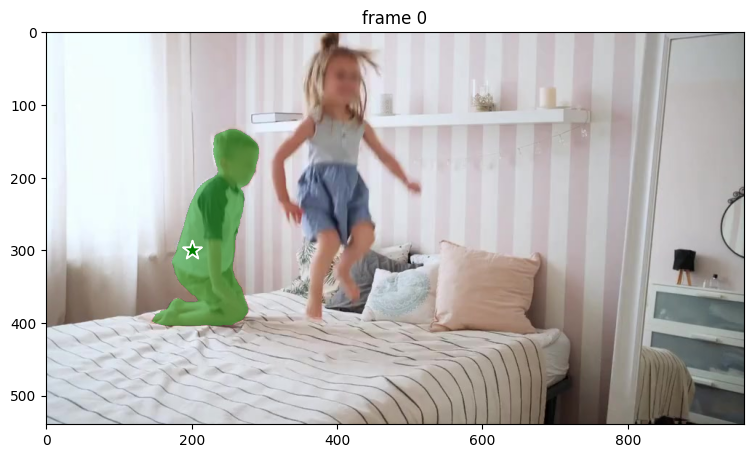

In [ ]:
ann_frame_idx = 0  # the frame index we interact with
ann_obj_id = 2  # give a unique id to each object we interact with (it can be any integers)

# Let's add a positive click at (x, y) = (200, 300) to get started on the first object
points = np.array([[200, 300]], dtype=np.float32)
# for labels, `1` means positive click and `0` means negative click
labels = np.array([1], np.int32)
prompts[ann_obj_id] = points, labels
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

# show the results on the current (interacted) frame
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_points(points, labels, plt.gca())
for i, out_obj_id in enumerate(out_obj_ids):
    show_points(*prompts[out_obj_id], plt.gca())
    show_mask((out_mask_logits[i] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_id)

Hmm, this time we just want to select the child's shirt, but the model predicts the mask for the entire child. Let's refine the prediction with a **negative click** at (x, y) = (275, 175).

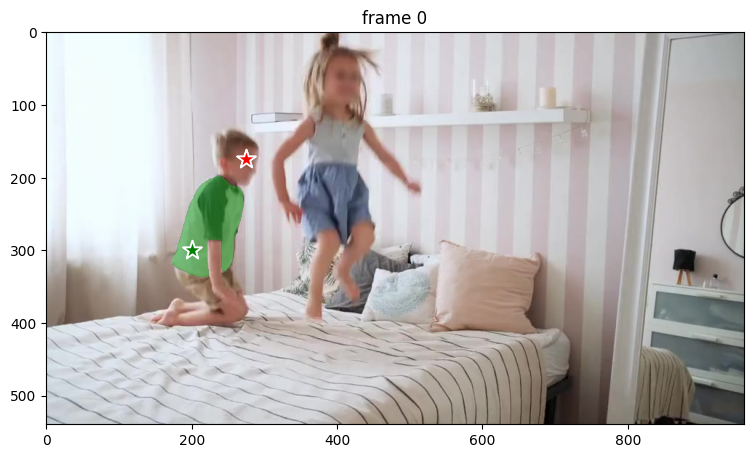

In [ ]:
# add the first object
ann_frame_idx = 0  # the frame index we interact with
ann_obj_id = 2  # give a unique id to each object we interact with (it can be any integers)

# Let's add a 2nd negative click at (x, y) = (275, 175) to refine the first object
# sending all clicks (and their labels) to `add_new_points_or_box`
points = np.array([[200, 300], [275, 175]], dtype=np.float32)
# for labels, `1` means positive click and `0` means negative click
labels = np.array([1, 0], np.int32)
prompts[ann_obj_id] = points, labels
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

# show the results on the current (interacted) frame
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_points(points, labels, plt.gca())
for i, out_obj_id in enumerate(out_obj_ids):
    show_points(*prompts[out_obj_id], plt.gca())
    show_mask((out_mask_logits[i] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_id)

After the 2nd negative click, now we get the left child's shirt as our first object.

Let's move on to the second object (the right child's shirt) with a positive click at (x, y) = (400, 150) on frame 0. Here we assign object id `3` to this second object (it can be arbitrary integers, and only needs to be unique for each object to track).

Note: when there are multiple objects, the `add_new_points_or_box` API will return a list of masks for each object.

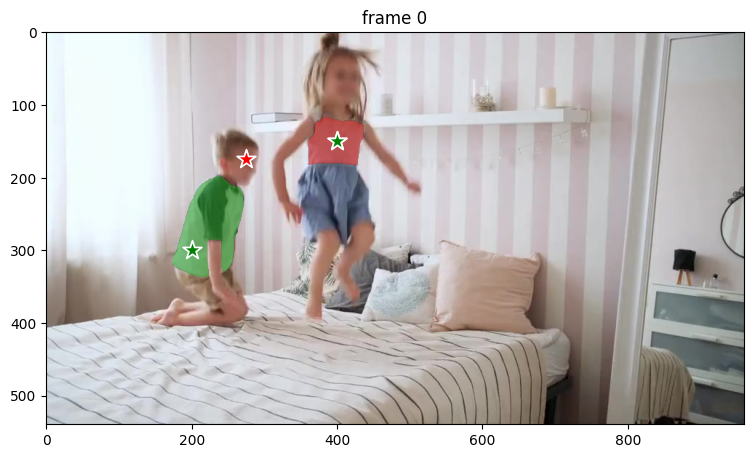

In [ ]:
ann_frame_idx = 0  # the frame index we interact with
ann_obj_id = 3  # give a unique id to each object we interact with (it can be any integers)

# Let's now move on to the second object we want to track (giving it object id `3`)
# with a positive click at (x, y) = (400, 150)
points = np.array([[400, 150]], dtype=np.float32)
# for labels, `1` means positive click and `0` means negative click
labels = np.array([1], np.int32)
prompts[ann_obj_id] = points, labels

# `add_new_points_or_box` returns masks for all objects added so far on this interacted frame
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

# show the results on the current (interacted) frame on all objects
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_points(points, labels, plt.gca())
for i, out_obj_id in enumerate(out_obj_ids):
    show_points(*prompts[out_obj_id], plt.gca())
    show_mask((out_mask_logits[i] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_id)

This time the model predicts the mask of the shirt we want to track in just one click. Nice!

#### Step 2: Propagate the prompts to get masklets across the video

Now, we propagate the prompts for both objects to get their masklets throughout the video.

Note: when there are multiple objects, the `propagate_in_video` API will return a list of masks for each object.

propagate in video: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [00:10<00:00, 18.87it/s]


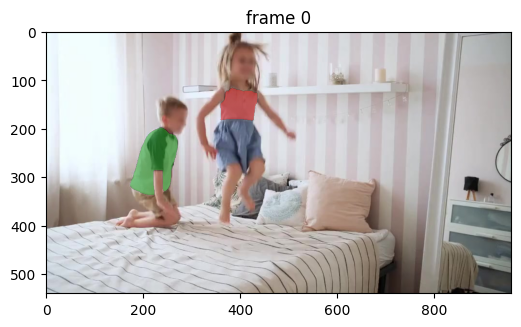

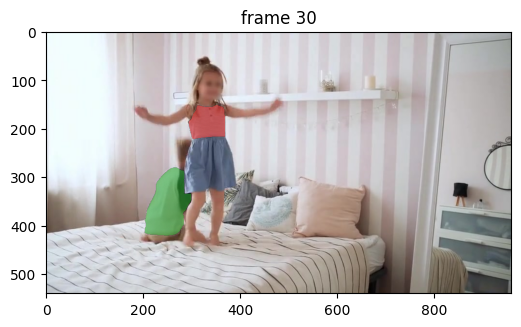

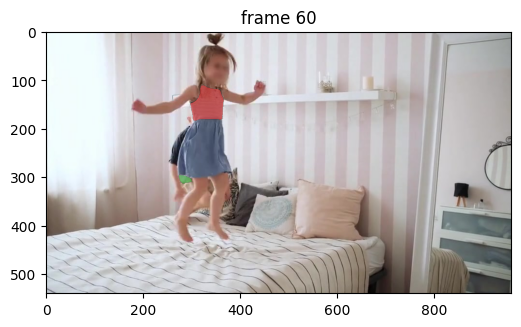

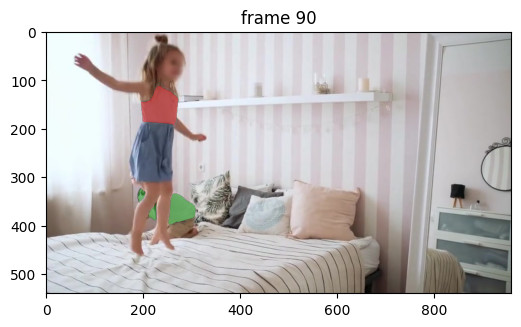

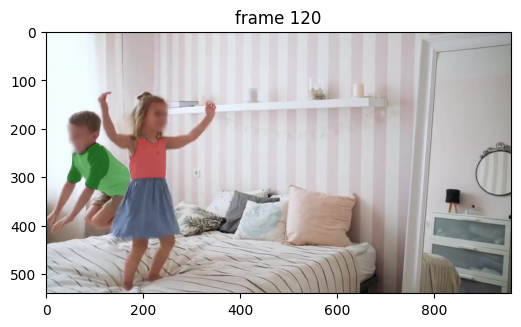

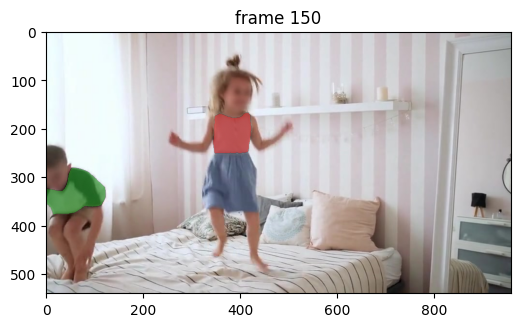

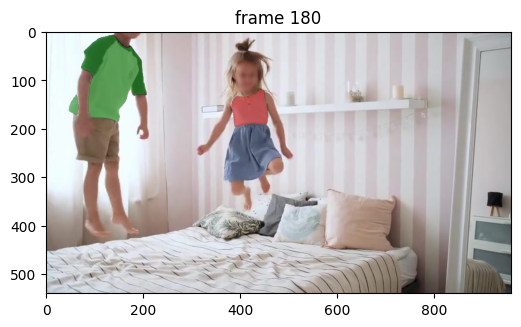

In [ ]:
# run propagation throughout the video and collect the results in a dict
video_segments = {}  # video_segments contains the per-frame segmentation results
for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
    video_segments[out_frame_idx] = {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
        for i, out_obj_id in enumerate(out_obj_ids)
    }

# render the segmentation results every few frames
vis_frame_stride = 30
plt.close("all")
for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(video_dir, frame_names[out_frame_idx])))
    for out_obj_id, out_mask in video_segments[out_frame_idx].items():
        show_mask(out_mask, plt.gca(), obj_id=out_obj_id)

Looks like both children's shirts are well segmented in this video.

Now you can try SAM 2 on your own videos and use cases!